# This is YOLOV5 custom object detection training and testing on Garbage dataset with Tensorflow and Pytorch

### Following preparation steps are :
```
1. Installation of multiple packages
2. Splitting Dataset into train, test, and val
3. Preprocessing custom dataset
4. Establishing Bounding box coordinates based on Garbage Dataset and parsing to yaml file

```

### Train, Test Val for Custom Model
```
5. Model is trained with 50 epoch and Saved as best.pt
6. Model is tested and validated with achieviemenet of 93 % accuracy(This can be increased with playing hyperparameters)

7.Model is then converted to ONNX and Onnx model is tested on unseen Images
    7.1. Model is saved as best.onnx
    7.2 Yaml Data has to ben added to provided custom classed to ONNX Model
8.ONNX Model is converted finally to TensorRT
    8.1 Tensorrt version is 8.6
    8.2 Install tensorrt with debian packages
    8.3.Install Opencv with Pip env
    8.4 Usage of TrtExec
        trtexec --help
    8.5 Install pycuda with Debian
9. TensorRT achieved great performance on test dataset with minibatces of 30 images
```


In [1]:
!nvidia-smi

Mon May  1 12:18:56 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.41.03              Driver Version: 530.41.03    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1050         Off| 00000000:01:00.0 Off |                  N/A |
| N/A   42C    P8               N/A /  N/A|      4MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# REFER ###https://blog.paperspace.com/train-yolov5-custom-data/

In [2]:
!python3 -m pip install --upgrade setuptools pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 8.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: setuptools
    Found existing installation: setuptools 67.6.0
    Uninstalling setuptools-67.6.0:
      Successfully uninstalled setuptools-67.6.0
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1


In [4]:
!pip install opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 6.2 MB/s eta 0:00:00:00:0100:01


In [7]:
!pip3 install -U scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 6.3 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 kB 2.0 MB/s eta 0:00:0000:01


In [ ]:
!pip install pandas

In [ ]:
!pip install seaborn

In [12]:
import glob
import shutil
import cv2
import os
import re
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split as tts
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random
import PIL

In [58]:
pwd

'/deeplearning/YOLOV5_TRASH'

In [15]:
ls /app/

ls: cannot access '/app/': No such file or directory


In [15]:
cd /app

/app


In [16]:
ls 

 Copy_of_YOloV5_.ipynb   annotations/  'garbage classification'/   yolov5/
 Untitled.ipynb          data/          images/                    yolov5s.pt


In [59]:
base_dir = "/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification"
train_dir = os.path.join(base_dir, 'train')
train_img_dir = os.path.join(train_dir, 'images')
train_label_dir = os.path.join(train_dir, 'labels')

test_dir = os.path.join(base_dir, 'test')
test_img_dir = os.path.join(test_dir, 'images')
test_label_dir = os.path.join(test_dir, 'labels')


In [60]:
def create_dir(path):
    if not os.path.exists(path):
        os.mkdir(path)

In [61]:
create_dir(train_dir)

In [62]:
create_dir(train_img_dir)
create_dir(train_label_dir)

In [63]:
create_dir(test_dir)
create_dir(test_img_dir)
create_dir(test_label_dir)

In [64]:
# visualize Classes
base_dir = "/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification"

classes = os.listdir(base_dir)

classes


['metal', 'test', 'plastic', 'glass', 'train', 'trash', 'paper', 'cardboard']

In [65]:
class_dirs = {name: os.path.join(base_dir, name) for name in classes}

In [66]:
def class_name(classes, base_dir):
    class_dirs = {name : os.path.join(base_dir, name) for name in classes}
    return class_dirs

In [67]:
class_name(classes, base_dir)

{'metal': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/metal',
 'test': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test',
 'plastic': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/plastic',
 'glass': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/glass',
 'train': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train',
 'trash': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/trash',
 'paper': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/paper',
 'cardboard': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/cardboard'}

In [68]:
class_dirs

{'metal': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/metal',
 'test': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test',
 'plastic': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/plastic',
 'glass': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/glass',
 'train': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train',
 'trash': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/trash',
 'paper': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/paper',
 'cardboard': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/cardboard'}

In [70]:
import os
import random
import shutil

dataset_dir = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification'
train_dir = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train'
test_dir = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test'

if not os.path.exists(train_dir):
    os.makedirs(train_dir)

if not os.path.exists(test_dir):
    os.makedirs(test_dir)

for class_name in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_dir):
        continue

    train_class_dir = os.path.join(train_dir, class_name)
    if not os.path.exists(train_class_dir):
        os.makedirs(train_class_dir)

    test_class_dir = os.path.join(test_dir, class_name)
    if not os.path.exists(test_class_dir):
        os.makedirs(test_class_dir)

    file_list = os.listdir(class_dir)
    file_list = [file for file in file_list if file.endswith('.jpg') or file.endswith('.jpeg') or file.endswith('.png')]

    random.shuffle(file_list)
    train_files = file_list[:int(0.8*len(file_list))]
    test_files = file_list[int(0.8*len(file_list)):]

    for file in train_files:
        src_path = os.path.join(class_dir, file)
        dst_path = os.path.join(train_class_dir, file)
        shutil.move(src_path, dst_path)

    for file in test_files:
        src_path = os.path.join(class_dir, file)
        dst_path = os.path.join(test_class_dir, file)
        shutil.move(src_path, dst_path)


In [71]:

garbage_count=[]
garbage_class=[]
for i in os.listdir(base_dir+'/train'):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir+'/train', i))))
garbage_df = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})



In [72]:

garbage_count=[]
garbage_class=[]
for i in os.listdir(base_dir+'/test'):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir+'/test', i))))
garbage_df_2 = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})


In [73]:
garbage_df_2

,garbage_class,garbage_count
0,metal,82
1,images,0
2,plastic,97
3,glass,101
4,labels,0
5,trash,28
6,paper,119
7,cardboard,81


In [74]:
garbage_df

,garbage_class,garbage_count
0,metal,328
1,images,0
2,plastic,385
3,glass,400
4,labels,0
5,trash,109
6,paper,475
7,cardboard,322


In [75]:
garbage_count = []
garbage_class = []

for i in os.listdir(base_dir  + "/train"):
    garbage_class.append(i)
    garbage_count.append(len(os.listdir(os.path.join(base_dir + "/train", i))))
garbage_df = pd.DataFrame({'garbage_class':garbage_class, 'garbage_count':garbage_count})

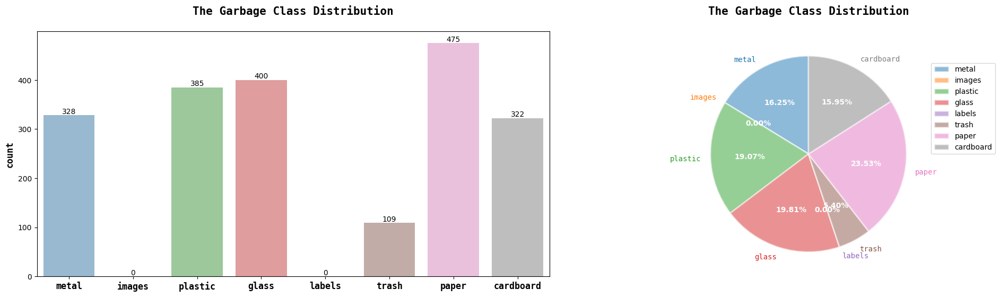

In [76]:
%matplotlib inline
fig,axes = plt.subplots(1,2,figsize=(25,6), gridspec_kw=dict(wspace=0.005))
sns.barplot(data=garbage_df, x='garbage_class', y='garbage_count',ax=axes[0], alpha=0.5)
for i in axes[0].get_xticklabels():
    i.set_font('monospace')
    i.set_weight('semibold')
    i.set_size(12)
for j in axes[0].containers:
    axes[0].bar_label(j)
    
axes[0].set_xlabel('')
axes[0].set_ylabel('count', font='monospace', weight='semibold', size=12)
axes[0].set_title('The Garbage Class Distribution\n', font='monospace', weight='semibold', size=15)

patches, texts, pcts = axes[1].pie(garbage_df['garbage_count'], labels=garbage_df['garbage_class'], wedgeprops={'linewidth': 2, 'edgecolor': 'white'},
            textprops={'size': 'x-large'}, startangle=90, autopct='%1.2f%%');
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())
    patch.set_alpha(0.5)
for j in pcts:
    j.set_size(10)
    j.set_color('white')
    j.set_weight('semibold')
plt.setp(texts, fontweight='semibold', font='monospace')
axes[1].legend(loc=[1,0.5])
axes[1].set_title('The Garbage Class Distribution\n', font='monospace', weight='semibold', size=15);

In [77]:
def create_yolo_boundbox(img_path):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    lower = np.array([20,20,20], dtype='uint8')
    upper = np.array([200,200,200],dtype='uint8')
    img = cv2.inRange(image, lower, upper)
    
    
    img = cv2.blur(img, (2,2))
    ret, thres = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY)
    img = cv2.bitwise_not(thres)
    contours, hierarchy = cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    contours = max(contours, key=lambda x: cv2.contourArea(x))
    
    # get bounding box coordinates
    xmin, ymin, xmax, ymax = cv2.boundingRect( contours)
    dimensions = img.shape
    h = img.shape[0]
    w = img.shape[1]
    
    # to calculate bndBox info for yolov5
    xp = (xmin + (xmax-xmin)/2) * 1.0 /w
    yp = (ymin + (ymax- ymin )/2 ) *1.0 /h
    wp = (xmax - xmin) * 1.0 / w
    hp = (ymax - ymin ) *1.0 / h
    
    return xp, yp, wp, hp
    
    

In [83]:
dataset_dir = "/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification"

In [84]:
glob.glob(dataset_dir)

['/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification']

In [85]:
pwd

'/deeplearning/YOLOV5_TRASH'

In [86]:
train_img_dir

'/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train/images'

In [87]:
test_img_dir, train_label_dir,

('/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images',
 '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train/labels')

In [88]:
for dirname, _, filenames in os.walk(dataset_dir):
    if dirname[1:].split('/')[-2]=='train':
        for img_path in glob.glob(dirname+'/*.jpg'):
            shutil.copy(img_path, os.path.join(train_dir, img_path.split('/')[-1]))

            label = 0
            if img_path.split('/')[-2] == 'cardboard':
                label=0
            elif img_path.split('/')[-2] == 'glass':
                label=1
            elif img_path.split('/')[-2] == 'metal':
                label=2
            elif img_path.split('/')[-2] == 'paper':
                label=3
            elif img_path.split('/')[-2] == 'plastic':
                label=4
            elif img_path.split('/')[-2] == 'trash':
                label=5
            x_center, y_center, box_width, box_height = create_yolo_boundbox(img_path)
            text = str(label)+' '+str(x_center)+' '+str(y_center)+' '+str(box_width)+' '+str(box_height)
            with open (os.path.join(train_label_dir, img_path.split('/')[-1][:-4]+'.txt'),'w') as file:
                file.write(text)

    if dirname[1:].split('/')[-2]=='test':
        for img_path in glob.glob(dirname+'/*.jpg'):
            shutil.copy(img_path, os.path.join(test_dir, img_path.split('/')[-1]))

            label = 0
            if img_path.split('/')[-2] == 'cardboard':
                label=0
            elif img_path.split('/')[-2] == 'glass':
                label=1
            elif img_path.split('/')[-2] == 'metal':
                label=2
            elif img_path.split('/')[-2] == 'paper':
                label=3
            elif img_path.split('/')[-2] == 'plastic':
                label=4
            elif img_path.split('/')[-2] == 'trash':
                label=5
            x_center, y_center, box_width, box_height = create_yolo_boundbox(img_path)
            text = str(label)+' '+str(x_center)+' '+str(y_center)+' '+str(box_width)+' '+str(box_height)
            with open (os.path.join(test_label_dir, img_path.split('/')[-1][:-4]+'.txt'),'w') as file:
                file.write(text)


In [89]:
test_img_dir

'/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images'

In [91]:


print(f'There are {len(os.listdir(train_img_dir))} train images')
print(f'There are {len(os.listdir(train_label_dir))} corresponding train labels\n')

print(f'There are {len(os.listdir(test_img_dir))} train images')
print(f'There are {len(os.listdir(test_label_dir))} corresponding test labels')



There are 2019 train images
There are 2019 corresponding train labels

There are 508 train images
There are 508 corresponding test labels


In [92]:
img = []
selected_img = random.sample([i for i in os.listdir(train_img_dir)], 10)
for i in selected_img:
    img.append(os.path.join(train_img_dir, i))


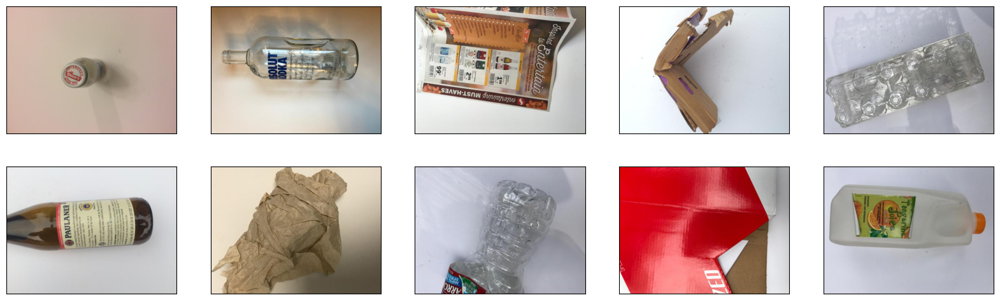

In [93]:
fig, axes = plt.subplots(2,5, figsize=(20,6), subplot_kw=dict(xticks=[], yticks=[]))
for i, ax in enumerate(axes.flat):
    ax.imshow(np.array(PIL.Image.open(img[i])))


In [94]:
yaml_file = """names:
- cardboard
- glass
- metal
- paper
- plastic
- trash
nc: 6
train: /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train/images
val: /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images

"""

with open('/deeplearning/data.yaml', 'w') as f:
    f.write(yaml_file)

In [1]:
sign_data = '/deeplearning/data.yaml'

In [6]:
import yaml

with open (sign_data, 'r') as f:
    data = yaml.safe_load(f)
    
print(data)

{'names': ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash'], 'nc': 6, 'train': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/train/images', 'val': '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images'}


In [97]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15627, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 15627 (delta 113), reused 135 (delta 65), pack-reused 15393
Receiving objects: 100% (15627/15627), 14.65 MiB | 9.53 MiB/s, done.
Resolving deltas: 100% (10637/10637), done.


In [100]:
cd  /deeplearning/YOLOV5_TRASH/yolov5/

/deeplearning/YOLOV5_TRASH/yolov5


# YOLOV5 REQUIREMENTS INSTALLATIONS

In [103]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 2.5 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 386.4 kB/s eta 0:00:0000:0100:03
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 7.3 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 327.8 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.9/195.9 kB 4.5 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 8.7 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 7.7 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 7.7 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 5.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [29]:
epochs=50
sign_data=sign_data
!python /deeplearning/YOLOV5_TRASH/yolov5/train.py --img 640 --batch 8 --epochs {epochs} --data {sign_data} --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=, data=/deeplearning/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 2 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
requirements: /deeplearning/YOLOV5_TRASH/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050, 4041MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, war

val: Scanning /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage 
val: WARNING ⚠️ /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard277.jpg: ignoring corrupt image/label: negative label values [   -0.52083]
val: WARNING ⚠️ /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard279.jpg: ignoring corrupt image/label: negative label values [   -0.17969]
val: WARNING ⚠️ /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard72.jpg: ignoring corrupt image/label: negative label values [   -0.40234]
val: WARNING ⚠️ /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass119.jpg: ignoring corrupt image/label: negative label values [   -0.21875]
val: WARNING ⚠️ /deeplearning/YOLOV5_TRASH/archive/garbage c

      18/49      1.81G   0.009711   0.007637    0.01928         17        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.786      0.645      0.738      0.653

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      19/49      1.81G    0.00976   0.007903    0.01941         17        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.742      0.654      0.699      0.641

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      20/49      1.81G   0.009116   0.007638    0.01889         18        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.637      0.783      0.767      0.724

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      21/4

      43/49      1.81G    0.00692    0.00639     0.0129         17        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.793      0.824      0.861      0.823

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      44/49      1.81G   0.005804   0.005973    0.01274         13        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.757      0.852      0.863      0.819

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      45/49      1.81G   0.005574   0.006036    0.01246         15        640: 1
                 Class     Images  Instances          P          R      mAP50   
                   all        500        500      0.834       0.81      0.885      0.843

      Epoch    GPU_mem   box_loss   obj_loss   cls_loss  Instances       Size
      46/4

In [ ]:
!python /deeplearning/YOLOV5_TRASH/yolov5/detect.py --source '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images' --weights '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt' --conf 0.25 --name yolo_road_det

In [8]:
!python /deeplearning/YOLOV5_TRASH/yolov5/detect.py --source '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images' --weights '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt' --conf 0.25 --name yolo_best_pt

detect: weights=['/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt'], source=/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=yolo_best_pt, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /deeplearning/YOLOV5_TRASH/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050, 4041MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Gar

image 43/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard299.jpg: 480x640 1 cardboard, 19.7ms
image 44/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard3.jpg: 480x640 1 cardboard, 19.5ms
image 45/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard311.jpg: 480x640 1 cardboard, 19.3ms
image 46/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard313.jpg: 480x640 1 cardboard, 19.9ms
image 47/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard316.jpg: 480x640 1 cardboard, 19.7ms
image 48/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/image

image 91/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass136.jpg: 480x640 1 glass, 19.9ms
image 92/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass141.jpg: 480x640 1 glass, 20.3ms
image 93/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass142.jpg: 480x640 1 glass, 20.3ms
image 94/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass147.jpg: 480x640 1 glass, 19.1ms
image 95/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass154.jpg: 480x640 1 plastic, 18.9ms
image 96/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass163.jpg: 480x640 1 glass, 19.

image 140/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass366.jpg: 480x640 1 glass, 24.7ms
image 141/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass367.jpg: 480x640 1 glass, 22.8ms
image 142/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass368.jpg: 480x640 1 glass, 19.6ms
image 143/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass372.jpg: 480x640 1 glass, 19.4ms
image 144/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass375.jpg: 480x640 1 glass, 1 metal, 19.4ms
image 145/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass383.jpg: 480x640

image 189/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal128.jpg: 480x640 1 metal, 23.9ms
image 190/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal134.jpg: 480x640 1 metal, 23.0ms
image 191/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal145.jpg: 480x640 1 metal, 21.5ms
image 192/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal147.jpg: 480x640 1 glass, 20.4ms
image 193/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal160.jpg: 480x640 1 metal, 18.7ms
image 194/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal163.jpg: 480x640 1 glass,

image 238/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal372.jpg: 480x640 1 metal, 21.0ms
image 239/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal374.jpg: 480x640 1 metal, 19.2ms
image 240/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal377.jpg: 480x640 1 metal, 19.6ms
image 241/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal378.jpg: 480x640 1 metal, 20.5ms
image 242/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal38.jpg: 480x640 1 metal, 21.5ms
image 243/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal380.jpg: 480x640 1 metal, 

image 287/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper208.jpg: 480x640 1 paper, 19.5ms
image 288/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper220.jpg: 480x640 1 paper, 20.2ms
image 289/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper223.jpg: 480x640 1 paper, 20.2ms
image 290/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper227.jpg: 480x640 1 paper, 19.8ms
image 291/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper232.jpg: 480x640 1 paper, 18.5ms
image 292/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper241.jpg: 480x640 1 paper,

image 336/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper423.jpg: 480x640 1 paper, 20.4ms
image 337/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper427.jpg: 480x640 1 paper, 20.1ms
image 338/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper433.jpg: 480x640 1 paper, 21.6ms
image 339/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper440.jpg: 480x640 1 paper, 21.3ms
image 340/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper441.jpg: 480x640 1 paper, 20.6ms
image 341/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper442.jpg: 480x640 1 paper,

image 385/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic109.jpg: 480x640 1 plastic, 19.0ms
image 386/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic114.jpg: 480x640 1 plastic, 18.6ms
image 387/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic121.jpg: 480x640 1 plastic, 19.1ms
image 388/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic125.jpg: 480x640 1 plastic, 18.6ms
image 389/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic128.jpg: 480x640 1 plastic, 19.3ms
image 390/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic130

image 433/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic309.jpg: 480x640 1 plastic, 19.2ms
image 434/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic31.jpg: 480x640 1 plastic, 18.8ms
image 435/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic314.jpg: 480x640 1 plastic, 19.4ms
image 436/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic319.jpg: 480x640 1 plastic, 18.7ms
image 437/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic32.jpg: 480x640 (no detections), 18.7ms
image 438/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plasti

image 481/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash105.jpg: 480x640 1 trash, 19.5ms
image 482/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash11.jpg: 480x640 1 plastic, 1 trash, 19.7ms
image 483/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash110.jpg: 480x640 1 plastic, 20.8ms
image 484/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash111.jpg: 480x640 1 trash, 20.1ms
image 485/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash117.jpg: 480x640 1 glass, 19.6ms
image 486/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash125.jpg: 480x

In [44]:
!python /deeplearning/YOLOV5_TRASH/yolov5/detect.py --source '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images' --weights '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx' --conf 0.25 --data {sign_data} --name yolo_best_onnx

detect: weights=['/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx'], source=/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images, data=/deeplearning/data.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=yolo_best_onnx, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /deeplearning/YOLOV5_TRASH/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050, 4041MiB)

Loading /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx for ONNX Runtime inference...
requirements: YOLOv5 requirement "onnxruntime-gpu" not found, attempting Auto

image 32/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard227.jpg: 640x640 1 cardboard, 25.4ms
image 33/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard242.jpg: 640x640 1 paper, 23.5ms
image 34/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard249.jpg: 640x640 1 cardboard, 24.9ms
image 35/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard254.jpg: 640x640 1 paper, 22.7ms
image 36/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard256.jpg: 640x640 1 cardboard, 23.4ms
image 37/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/card

image 79/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard95.jpg: 640x640 2 cardboards, 22.6ms
image 80/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard97.jpg: 640x640 1 cardboard, 24.2ms
image 81/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard99.jpg: 640x640 1 metal, 22.7ms
image 82/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass102.jpg: 640x640 1 glass, 1 plastic, 22.4ms
image 83/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass105.jpg: 640x640 1 glass, 22.4ms
image 84/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass10

image 128/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass302.jpg: 640x640 1 glass, 22.4ms
image 129/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass303.jpg: 640x640 1 glass, 22.6ms
image 130/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass305.jpg: 640x640 1 glass, 22.5ms
image 131/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass31.jpg: 640x640 1 glass, 22.6ms
image 132/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass316.jpg: 640x640 1 glass, 22.9ms
image 133/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass319.jpg: 640x640 1 glass, 

image 178/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass77.jpg: 640x640 1 glass, 23.6ms
image 179/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass8.jpg: 640x640 1 glass, 22.4ms
image 180/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass92.jpg: 640x640 1 glass, 24.4ms
image 181/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass95.jpg: 640x640 1 glass, 25.0ms
image 182/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass97.jpg: 640x640 1 glass, 22.5ms
image 183/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal109.jpg: 640x640 1 glass, 1 met

image 227/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal318.jpg: 640x640 1 metal, 23.1ms
image 228/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal326.jpg: 640x640 1 metal, 24.5ms
image 229/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal329.jpg: 640x640 1 metal, 22.7ms
image 230/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal337.jpg: 640x640 1 metal, 22.4ms
image 231/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal341.jpg: 640x640 1 metal, 22.5ms
image 232/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal344.jpg: 640x640 1 metal,

image 277/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper171.jpg: 640x640 1 paper, 23.2ms
image 278/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper18.jpg: 640x640 1 paper, 22.5ms
image 279/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper184.jpg: 640x640 1 paper, 22.8ms
image 280/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper185.jpg: 640x640 1 paper, 22.7ms
image 281/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper187.jpg: 640x640 1 paper, 23.4ms
image 282/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper193.jpg: 640x640 1 paper, 

image 326/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper392.jpg: 640x640 1 paper, 23.6ms
image 327/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper396.jpg: 640x640 1 paper, 23.6ms
image 328/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper397.jpg: 640x640 1 paper, 27.8ms
image 329/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper398.jpg: 640x640 1 paper, 24.5ms
image 330/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper40.jpg: 640x640 1 paper, 25.5ms
image 331/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper405.jpg: 640x640 1 paper, 

image 375/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper590.jpg: 640x640 1 paper, 1 trash, 24.6ms
image 376/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper6.jpg: 640x640 (no detections), 23.8ms
image 377/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper64.jpg: 640x640 1 paper, 24.4ms
image 378/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper67.jpg: 640x640 1 paper, 25.6ms
image 379/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper69.jpg: 640x640 1 paper, 24.5ms
image 380/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper78.jpg: 640x6

image 424/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic282.jpg: 640x640 1 plastic, 22.8ms
image 425/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic287.jpg: 640x640 1 plastic, 23.1ms
image 426/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic289.jpg: 640x640 1 plastic, 23.1ms
image 427/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic292.jpg: 640x640 1 plastic, 22.6ms
image 428/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic295.jpg: 640x640 1 plastic, 23.8ms
image 429/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic30.

image 473/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic62.jpg: 640x640 1 plastic, 23.7ms
image 474/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic70.jpg: 640x640 1 plastic, 26.1ms
image 475/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic79.jpg: 640x640 1 plastic, 24.5ms
image 476/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic80.jpg: 640x640 1 plastic, 22.6ms
image 477/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic81.jpg: 640x640 1 plastic, 24.6ms
image 478/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic83.jpg: 

# Detection results with best.onnx
```
results_onnx = '/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_best_onnx/'

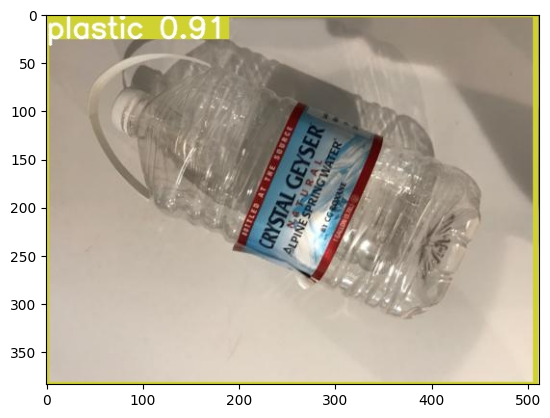

In [47]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
results = '/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_best_onnx/'

detection_images = [os.path.join(results, image) for image in os.listdir(results)]
random_images = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_images))

# Detection results with best.pt
```
results = '/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_best_pt/'
```

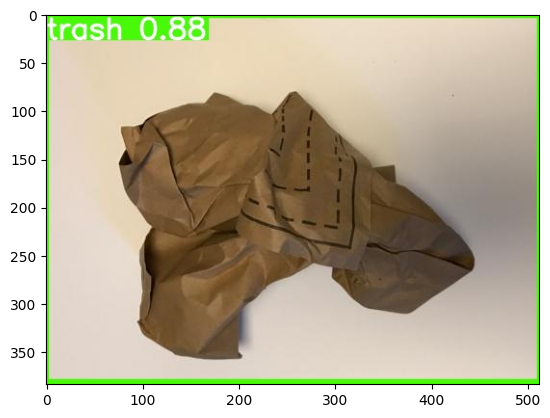

In [21]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random
results = '/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_best_pt/'

detection_images = [os.path.join(results, image) for image in os.listdir(results)]
random_images = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_images))

In [55]:
    os.listdir('/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4')

['hyp.yaml',
 'F1_curve.png',
 'PR_curve.png',
 'train_batch1.jpg',
 'results.csv',
 'labels.jpg',
 'R_curve.png',
 'val_batch2_labels.jpg',
 'weights',
 'val_batch0_labels.jpg',
 'P_curve.png',
 'val_batch1_pred.jpg',
 'opt.yaml',
 'confusion_matrix.png',
 'results.png',
 'val_batch2_pred.jpg',
 'val_batch1_labels.jpg',
 'train_batch0.jpg',
 'events.out.tfevents.1683461283.cc1aaeb89298.879.0',
 'labels_correlogram.jpg',
 'train_batch2.jpg',
 'val_batch0_pred.jpg']

In [28]:
!tensorboard --logdir /deeplearning/YOLOV5_TRASH/yolov5/runs/train

2023-05-07 12:07:13.069540: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-07 12:07:14.725217: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-07 12:07:16.210636: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
import torch

In [111]:
!pip install tensorboard

In [22]:
exp_path4 = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4'

In [23]:
import matplotlib.pyplot as plt
from PIL import Image

In [25]:
exp_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4'

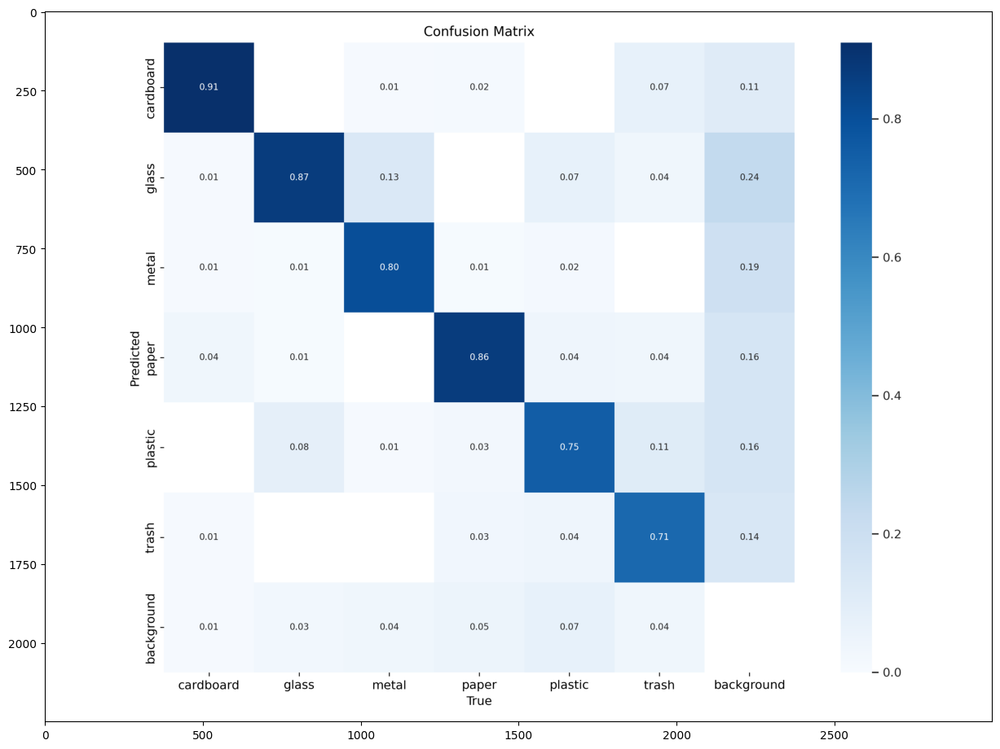

In [26]:
img_path = exp_path + '/confusion_matrix.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)



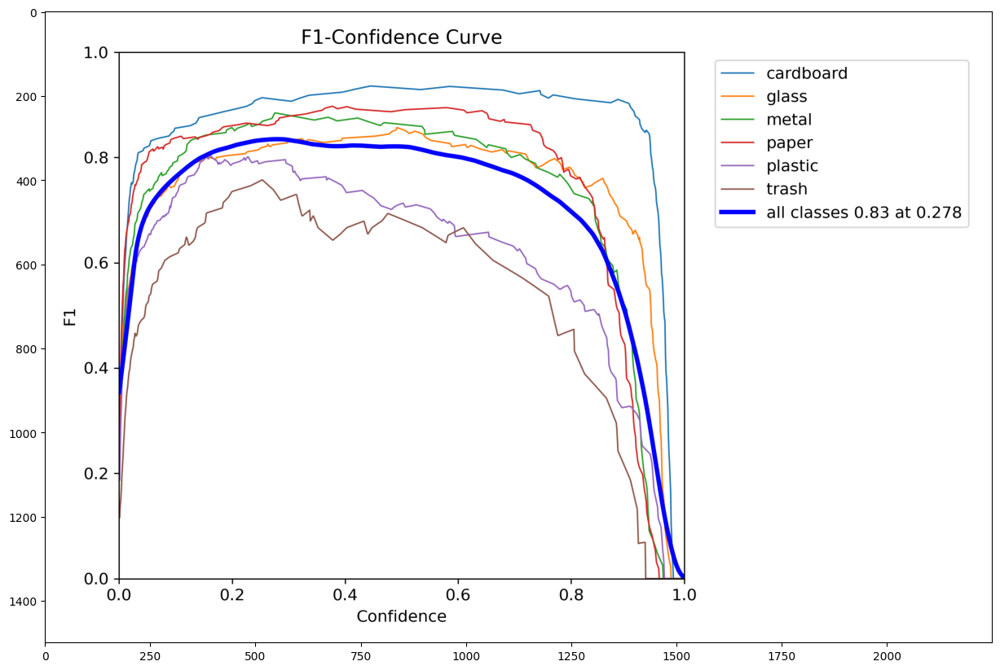

In [27]:


img_path = exp_path + '/F1_curve.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

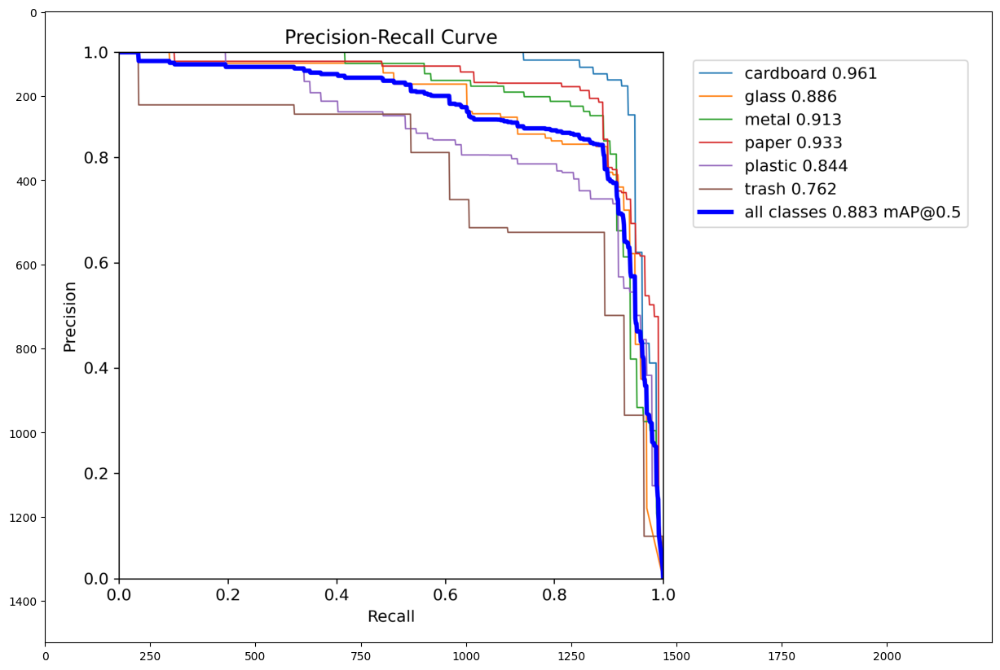

In [28]:

img_path = exp_path + '/PR_curve.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

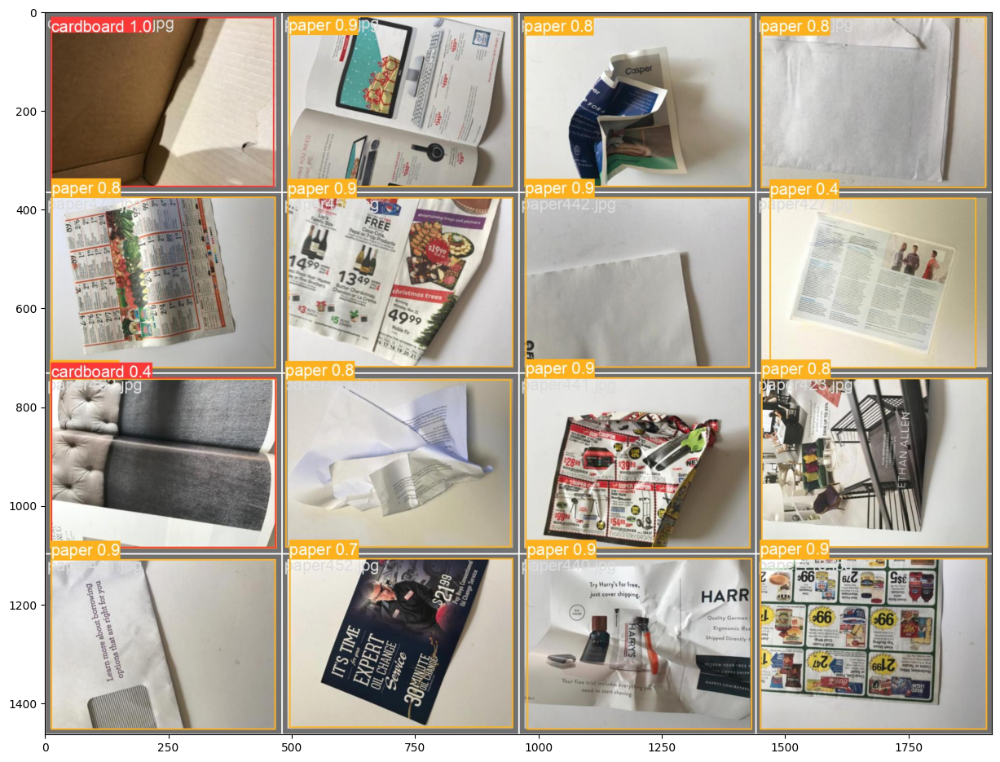

In [29]:

img_path = exp_path + '/val_batch0_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

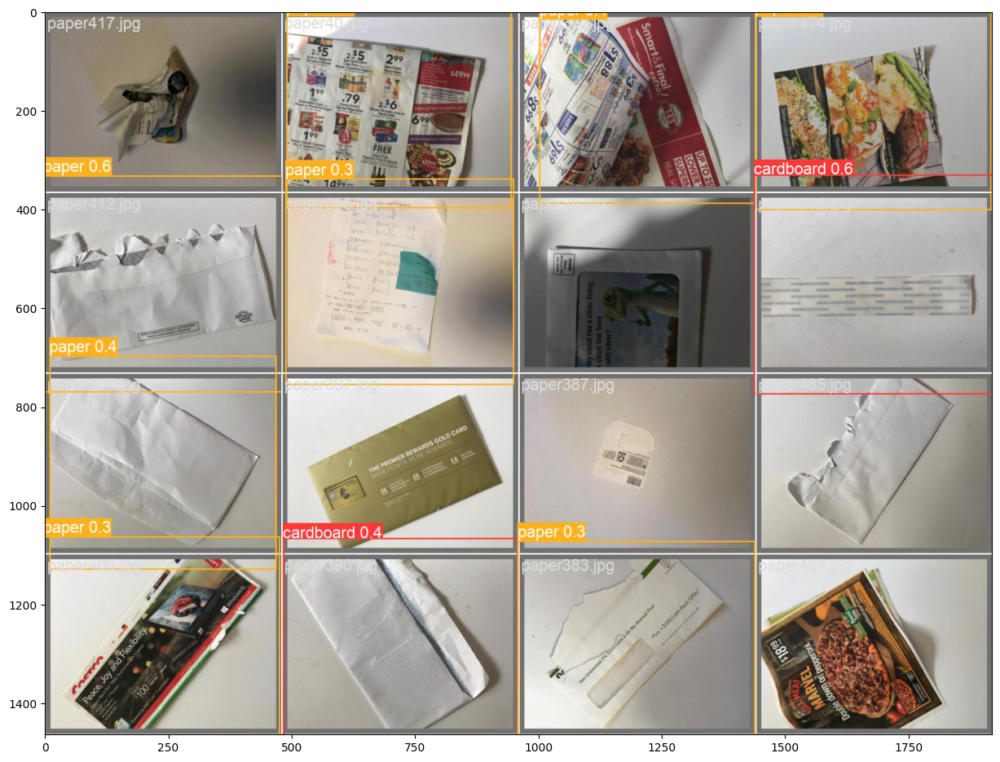

In [123]:

img_path = exp_path + '/val_batch1_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

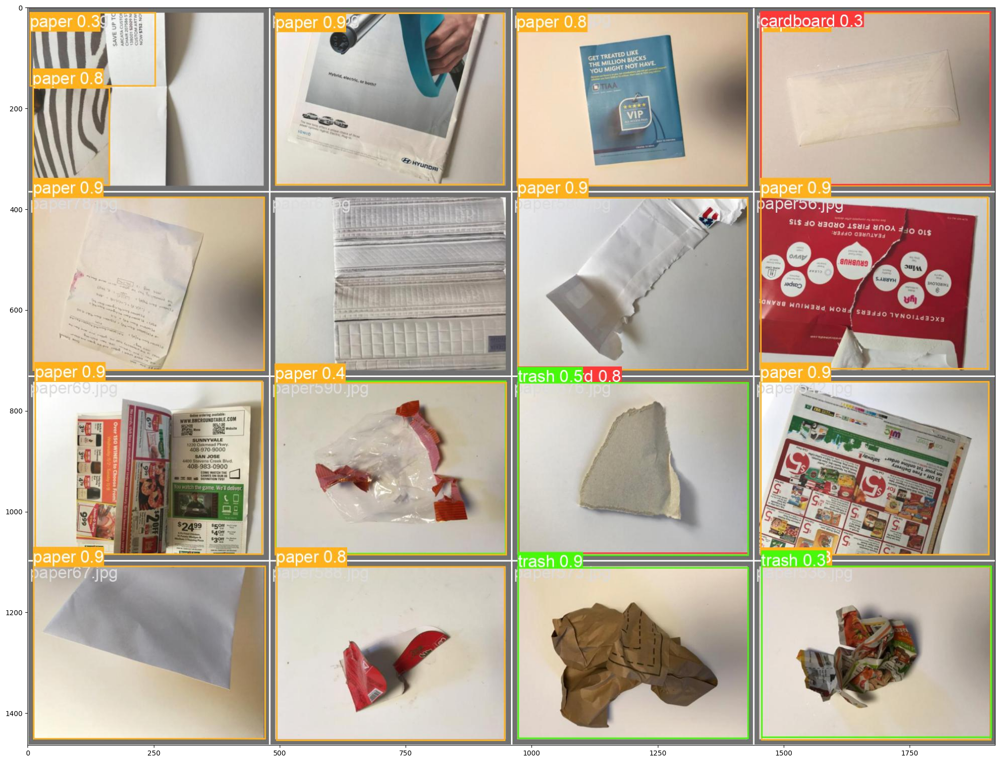

In [30]:

img_path = exp_path + '/val_batch2_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(25, 25))
plt.imshow(img)

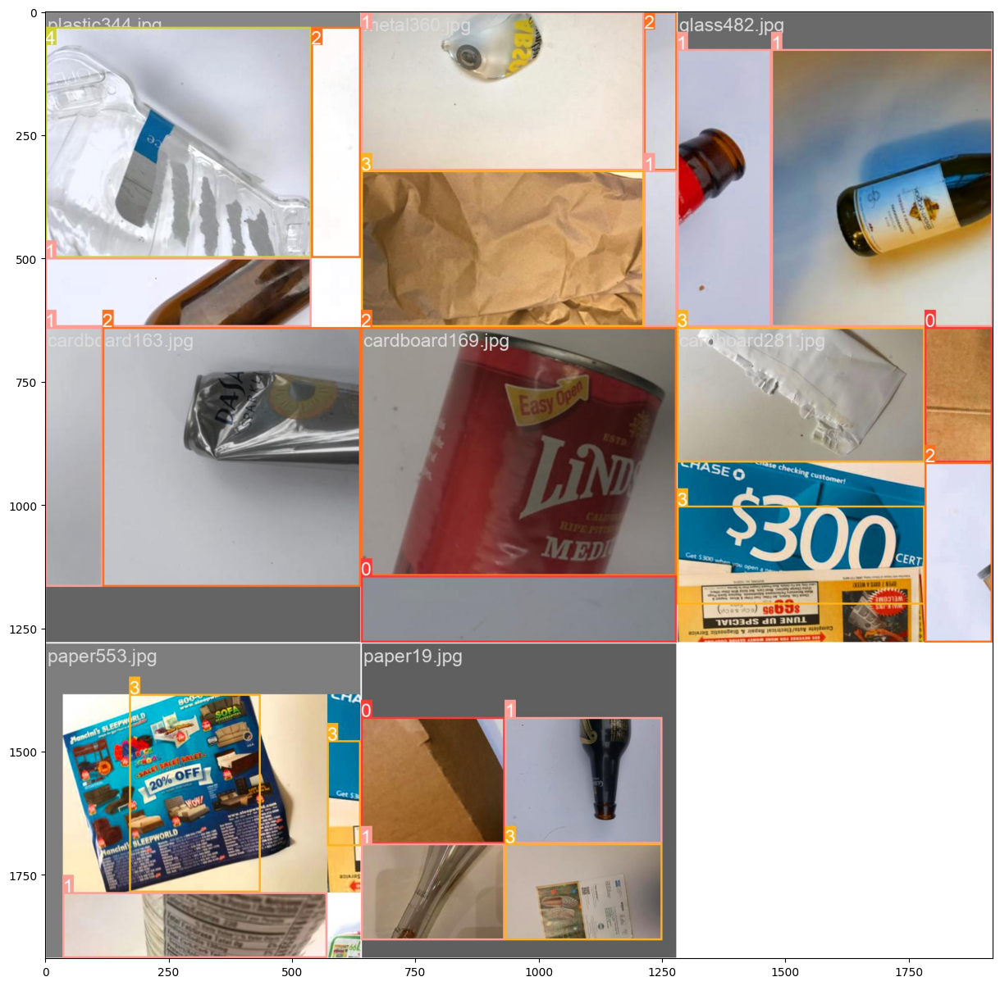

In [31]:

img_path = exp_path + '/train_batch0.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

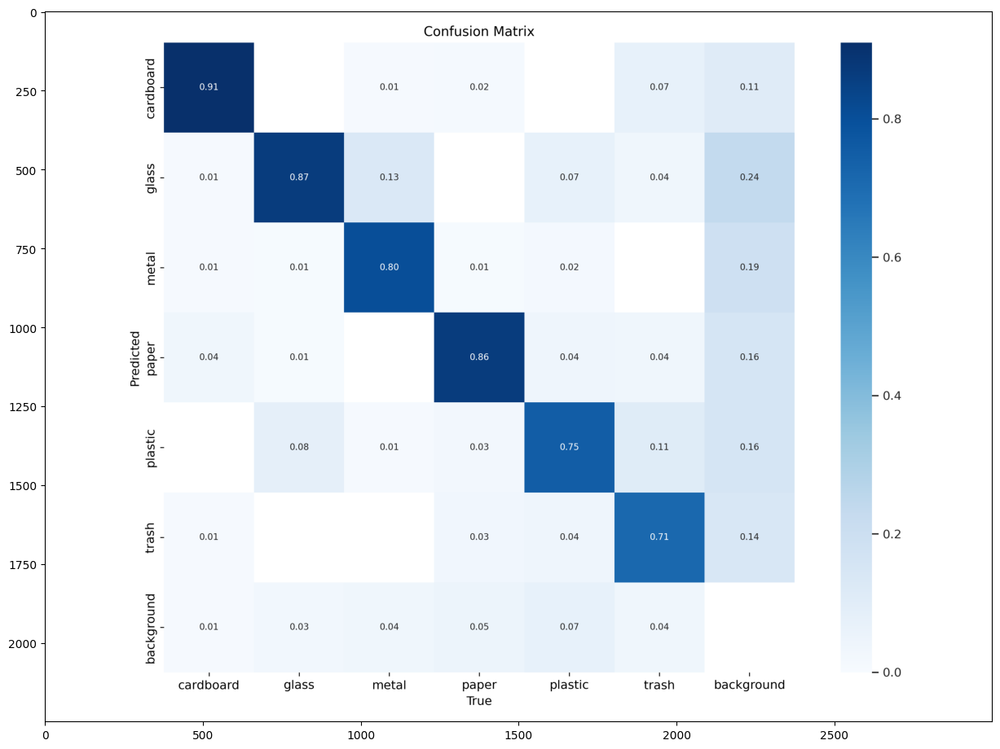

In [33]:
img_path = exp_path4 + '/confusion_matrix.png'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


# PREDICTIONS IMAGES FROM VALIDATION

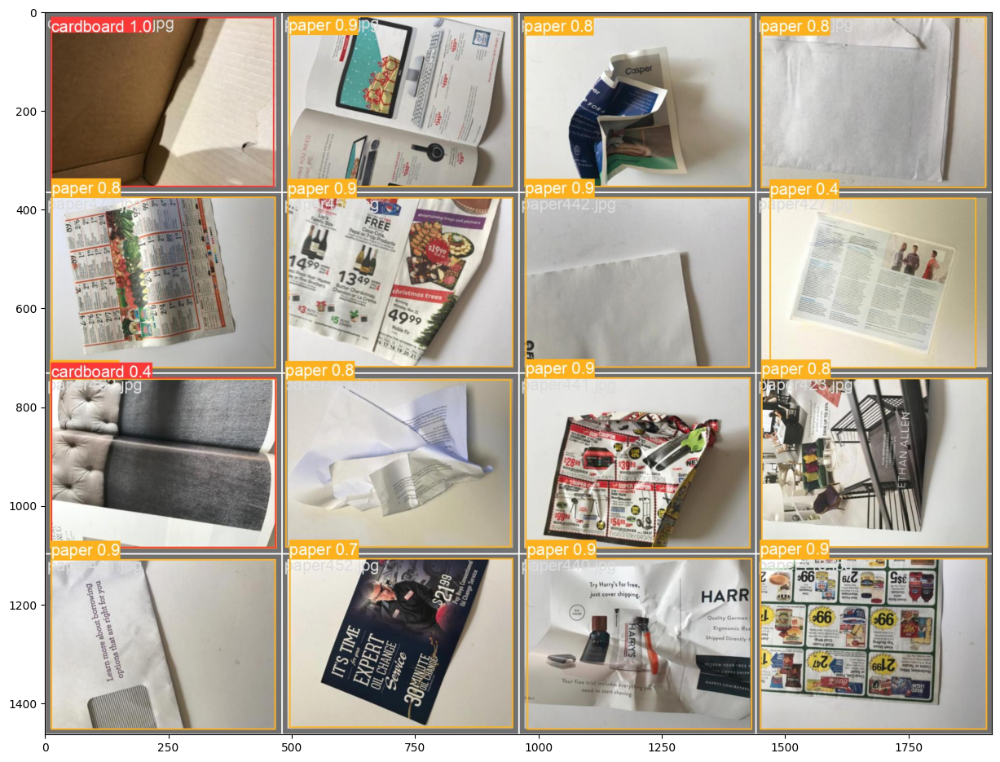

In [34]:
img_path = exp_path4 + '/val_batch0_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)

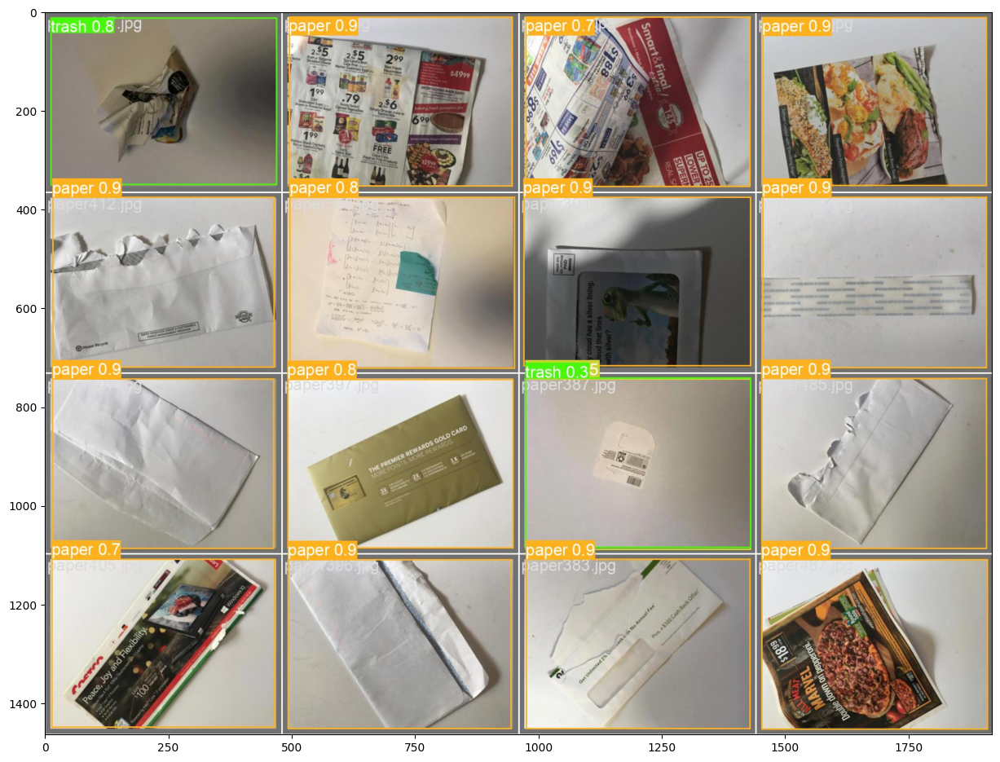

In [35]:
img_path = exp_path4 + '/val_batch1_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


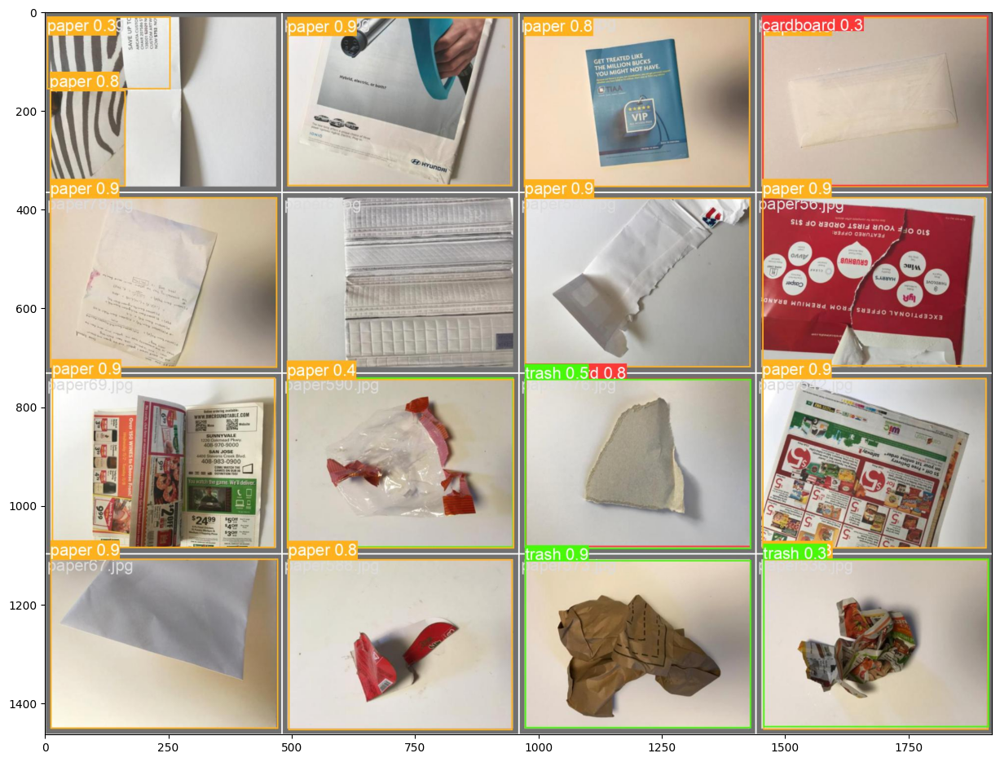

In [36]:
img_path = exp_path4 + '/val_batch2_pred.jpg'
img = Image.open(img_path)
plt.figure(figsize=(15, 15))
plt.imshow(img)


```
--source -> path to test images

--weights -> path to best.pt
--conf 0.25
--name of directory -> yolo_road-det

```

### DETECTION ON TEST IMAGES -> Results saved to runs/detect/yolo_road_det4

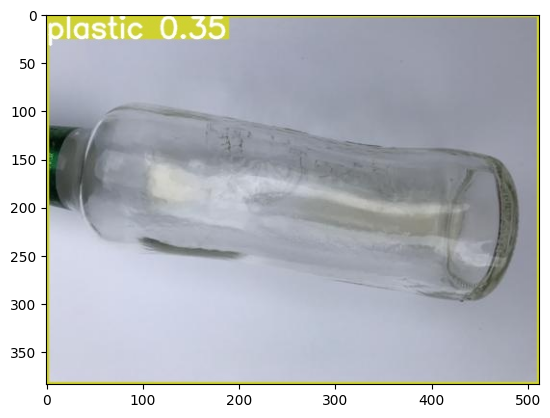

In [136]:
detections_dir = "/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_road_det4"


detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

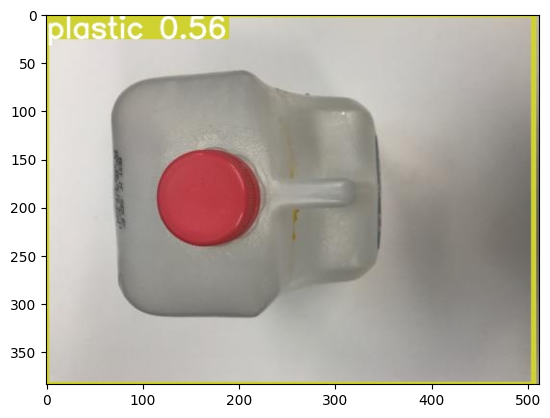

In [137]:
detections_dir = "/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_road_det4"


detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

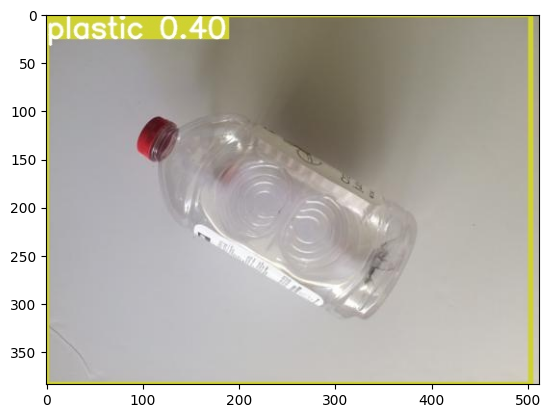

In [140]:
detections_dir = "/deeplearning/YOLOV5_TRASH/yolov5/runs/detect/yolo_road_det4"


detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

random_detection_image = Image.open(random.choice(detection_images))
plt.imshow(np.array(random_detection_image))

### INSTALL TENSORRT

In [145]:
import tensorrt
assert tensorrt.Builder(tensorrt.Logger())

In [146]:
print(tensorrt.__version__)

8.6.0


# CONVERT PT. MODEL TO ONNX  MAIN!

In [65]:
!python /deeplearning/YOLOV5_TRASH/yolov5/export.py --weights /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt --data {sign_data} --include onnx

export: data=/deeplearning/data.yaml, weights=['/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.pt with output shape (1, 25200, 11) (13.7 MB)

ONNX: starting export with onnx 1.13.1...
============= Diagnostic Run torch.onnx.export version 2.0.0+cu117 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX: export success ✅ 1.2s, saved as /deeplearning/YOL

In [66]:
#HOW TO FIND TENSOR INPUT DIMENSION THAT IS GIVEN TO ONNX


import onnx
import numpy as np

# Load the ONNX model
model_path = "/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx"
onnx_model = onnx.load(model_path)

# Get the shape of the input tensor
input_shape = onnx_model.graph.input[0].type.tensor_type.shape.dim
input_shape = [d.dim_value for d in input_shape]

# Print the input shape
print("Input shape:", input_shape)

Input shape: [1, 3, 640, 640]


In [3]:
import tensorflow as tf
import tensorrt as trt
import ctypes
#import uff
import tensorrt as trt
#import graphsurgeon as gs
import argparse


2023-05-01 20:14:03.676645: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# CONVERT ONNX TO TENSORRT

In [99]:
    ! /usr/src/tensorrt/bin/trtexec --onnx=/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx --explicitBatch --saveEngine=/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine --workspace=2048 --fp16

&&&& RUNNING TensorRT.trtexec [TensorRT v8600] # /usr/src/tensorrt/bin/trtexec --onnx=/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx --explicitBatch --saveEngine=/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine --workspace=2048 --fp16
[05/09/2023-11:07:39] [W] --explicitBatch flag has been deprecated and has no effect!
[05/09/2023-11:07:39] [W] Explicit batch dim is automatically enabled if input model is ONNX or if dynamic shapes are provided when the engine is built.
[05/09/2023-11:07:39] [W] --workspace flag has been deprecated by --memPoolSize flag.
[05/09/2023-11:07:39] [I] === Model Options ===
[05/09/2023-11:07:39] [I] Format: ONNX
[05/09/2023-11:07:39] [I] Model: /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/best.onnx
[05/09/2023-11:07:39] [I] Output:
[05/09/2023-11:07:39] [I] === Build Options ===
[05/09/2023-11:07:39] [I] Max batch: explicit batch
[05/09/2023-11:07:39] [I] Memory Pools: workspace: 2048 MiB, dlaSRAM: def

[05/09/2023-11:13:00] [I] Engine built in 320.581 sec.
[05/09/2023-11:13:00] [I] [TRT] Loaded engine size: 34 MiB
[05/09/2023-11:13:00] [I] [TRT] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +34, now: CPU 0, GPU 34 (MiB)
[05/09/2023-11:13:00] [I] Engine deserialized in 0.0284213 sec.
[05/09/2023-11:13:00] [I] [TRT] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +36, now: CPU 0, GPU 70 (MiB)
[05/09/2023-11:13:00] [W] [TRT] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
[05/09/2023-11:13:00] [I] Setting persistentCacheLimit to 0 bytes.
[05/09/2023-11:13:00] [I] Using random values for input images
[05/09/2023-11:13:00] [I] Created input binding for images with dimensions 1x3x640x640
[05/09/2023-11:13:00]

## TENSORT INPUT AND OUTPUT DIMENTSIONE

[05/06/2023-14:02:31] [I] Created input binding for images with dimensions 1x3x640x640
[05/06/2023-14:02:31] [I] Using random values for output output0
[05/06/2023-14:02:31] [I] Created output binding for output0 with dimensions 1x25200x11

In [7]:
image_read = cv2.imread("/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg")
img = image_read.shape
img

(384, 512, 3)

In [3]:
import tensorrt as trt
import pycuda.driver as cuda
import pycuda.autoinit
import numpy as np
import cv2

# Load engine
with open('/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/best.engine', 'rb') as f:
    engine_data = f.read()
runtime = trt.Runtime(trt.Logger())
engine = runtime.deserialize_cuda_engine(engine_data)

# Create execution context
context = engine.create_execution_context()

# Prepare input and output bindings
inputs = []
outputs = []
bindings = []
for binding in engine:
    size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
    dtype = trt.nptype(engine.get_binding_dtype(binding))
    host_mem = cuda.pagelocked_empty(size, dtype)
    device_mem = cuda.mem_alloc(host_mem.nbytes)
    bindings.append(int(device_mem))
    if engine.binding_is_input(binding):
        inputs.append({'host': host_mem, 'device': device_mem})
    else:
        outputs.append({'host': host_mem, 'device': device_mem})

# Load image and preprocess
image = cv2.imread('/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg')
image = cv2.resize(image, (640, 640))
image = np.transpose(image, (2, 0, 1)).astype(np.float32) / 255.0

# Run inference
inputs[0]['host'] = np.ascontiguousarray(image)
cuda.memcpy_htod(inputs[0]['device'], inputs[0]['host'])
context.execute_v2(bindings=bindings)
cuda.memcpy_dtoh(outputs[0]['host'], outputs[0]['device'])
output = np.reshape(outputs[0]['host'], (1, -1, 85))

# Get detections
for i in range(output.shape[1]):
    class_id = np.argmax(output[0, i, 5:])
    score = output[0, i, 5 + class_id]
    if score > 0.5:
        x1, y1, x2, y2 = output[0, i, :4].astype(np.int32)
        print('Detection {}: class={}, confidence={}, bbox=[{},{},{},{}]'.format(i, class_id, score, x1, y1, x2, y2))


/tmp/ipykernel_13/72779967.py:21: DeprecationWarning: Use get_tensor_shape instead.
  size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
/tmp/ipykernel_13/72779967.py:21: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
/tmp/ipykernel_13/72779967.py:22: DeprecationWarning: Use get_tensor_dtype instead.
  dtype = trt.nptype(engine.get_binding_dtype(binding))
/tmp/ipykernel_13/72779967.py:26: DeprecationWarning: Use get_tensor_mode instead.
  if engine.binding_is_input(binding):


[05/02/2023-11:14:50] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
[05/02/2023-11:14:50] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.
[05/02/2023-11:14:50] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.


ValueError: cannot reshape array of size 277200 into shape (1,newaxis,85)

In [1]:
engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg'

In [31]:
import tensorrt as trt
import pycuda.driver as cuda
import pycuda.autoinit
import numpy as np
import cv2

# Load the TensorRT engine from file
with open(engine_path, 'rb') as f, trt.Runtime(trt.Logger()) as runtime:
    engine = runtime.deserialize_cuda_engine(f.read())

# Create the TensorRT context and allocate memory for input and output bindings
with engine.create_execution_context() as context:
    inputs, outputs, bindings, stream = [], [], [], cuda.Stream()
    for binding in engine:
        size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
       
        dtype = trt.nptype(engine.get_binding_dtype(binding))
        print('size', size, 'dtype.itemsize: ', dtype.itemsize) 
        # Allocate device memory
        cuda_mem = cuda.mem_alloc(size * dtype.itemsize)
        # Append to inputs or outputs list
        if engine.binding_is_input(binding):
            inputs.append({'name': binding, 'shape': engine.get_binding_shape(binding), 'dtype': dtype, 'cuda_mem': cuda_mem})
        else:
            outputs.append({'name': binding, 'shape': engine.get_binding_shape(binding), 'dtype': dtype, 'cuda_mem': cuda_mem})
        # Append to bindings and transfer ownership to CUDA context
        bindings.append(int(cuda_mem))
        context.set_binding_shape(binding, tuple([1] + list(engine.get_binding_shape(binding)[1:])))

    # Load the input image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (input_shape[2], input_shape[1]))
    img = img.astype(np.float32) / 255.0
    img = np.transpose(img, (2, 0, 1))
    img = np.expand_dims(img, axis=0)

    # Transfer input data to device memory
    inputs[0]['cuda_mem'].copy_from_gpu(img.ravel().view(np.uint8))

    # Execute the inference
    context.execute_v2(bindings=bindings)

    # Transfer output data to host memory
    outputs[0]['cuda_mem'].copy_to_gpu()
    output_data = cuda.mem_alloc(outputs[0]['cuda_mem'].nbytes)
    cuda.memcpy_dtod(output_data, outputs[0]['cuda_mem'], outputs[0]['cuda_mem'].nbytes)
    output_data = np.frombuffer(output_data, dtype=np.float32).reshape(outputs[0]['shape'])

    # Perform post-processing on the output data (e.g. decode bounding boxes)

    # Print the output
    print(output_data)


[05/02/2023-12:09:44] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
size 1228800 dtype.itemsize:  <attribute 'itemsize' of 'numpy.generic' objects>
[05/02/2023-12:09:44] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.


/tmp/ipykernel_13/918134727.py:15: DeprecationWarning: Use get_tensor_shape instead.
  size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
/tmp/ipykernel_13/918134727.py:15: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  size = trt.volume(engine.get_binding_shape(binding)) * engine.max_batch_size
/tmp/ipykernel_13/918134727.py:17: DeprecationWarning: Use get_tensor_dtype instead.
  dtype = trt.nptype(engine.get_binding_dtype(binding))


TypeError: unsupported operand type(s) for *: 'int' and 'getset_descriptor'

In [11]:
import pycuda.autoinit
import pycuda.driver as cuda
import tensorrt as trt
import numpy as np
import cv2

# Load the serialized TensorRT engine
with open(engine_path, 'rb') as f:
    engine_data = f.read()
    
runtime = trt.Runtime(trt.Logger())
engine = runtime.deserialize_cuda_engine(engine_data)

# Create the execution context
context = engine.create_execution_context()

# Create a host buffer for the input data
input_host = cuda.pagelocked_empty(trt.volume(engine.get_binding_shape(0)), np.float32)

# Create a device buffer for the input data
input_device = cuda.mem_alloc(input_host.nbytes)

# Create a host buffer for the output data
output_host = cuda.pagelocked_empty(trt.volume(engine.get_binding_shape(1)), np.float32)

# Create a device buffer for the output data
output_device = cuda.mem_alloc(output_host.nbytes)

# Load the image and pre-process it for inference
img = cv2.imread(image_path)
img = cv2.resize(img, (640, 640))
img = img.transpose((2, 0, 1)).astype(np.float32) / 255.0
img = np.ascontiguousarray(img)

# Copy the input data to the device buffer
cuda.memcpy_htod(input_device, img.ravel())

# Run inference
context.execute_v2(bindings=[int(input_device), int(output_device)])

# Copy the output data from the device buffer
cuda.memcpy_dtoh(output_host, output_device)

# Reshape the output array and get the class predictions
output = output_host.reshape((1, -1, 85))
class_preds = np.argmax(output[..., 5:], axis=-1)

# Print the class predictions
print(class_preds)

[05/02/2023-11:24:53] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading


/tmp/ipykernel_13/238346418.py:18: DeprecationWarning: Use get_tensor_shape instead.
  input_host = cuda.pagelocked_empty(trt.volume(engine.get_binding_shape(0)), np.float32)
/tmp/ipykernel_13/238346418.py:24: DeprecationWarning: Use get_tensor_shape instead.
  output_host = cuda.pagelocked_empty(trt.volume(engine.get_binding_shape(1)), np.float32)


ValueError: cannot reshape array of size 277200 into shape (1,newaxis,85)

In [37]:
import pycuda.driver as cuda
import pycuda.autoinit
import numpy as np
import tensorrt as trt
import cv2

# Load TensorRT engine
engine_file_path = engine_path
with open(engine_file_path, "rb") as f, trt.Runtime(trt.Logger()) as runtime:
    engine = runtime.deserialize_cuda_engine(f.read())

# Create execution context
context = engine.create_execution_context()

# Allocate device memory for input and output
input_shape = engine.get_binding_shape(0)
print('Input Shape : ',input_shape)

input_size = trt.volume(input_shape) * engine.max_batch_size
print('Input Size : ',input_size)

trt.infer.DataType_kFLOAT: np.float32
input_dtype = trt.nptype(engine.get_binding_dtype(0))
print('Input Datatype : ',input_dtype)

print('------------------------------------------')
print('------------------------------------------')

output_shape = engine.get_binding_shape(1)
print('Output Shape: ',output_shape)

output_size = trt.volume(output_shape) * engine.max_batch_size
print('Output Size: ',output_size)

output_dtype = trt.nptype(engine.get_binding_dtype(1))
print('Output DataType: ',output_dtype)

# allocate memory on GPU
size = 1228800
dtype = np.float32
input_mem = cuda.mem_alloc(size * dtype.itemsize)

output_mem = cuda.mem_alloc(output_size * output_dtype.itemsize)

# Load random image
image_path = image_path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, tuple(input_shape[-2:]))
image = image.astype(input_dtype)

# Copy input data to device memory
cuda.memcpy_htod(input_mem, image)

# Perform inference
context.execute(batch_size=1, bindings=[int(input_mem), int(output_mem)])

# Copy output data to host memory
output = np.empty((engine.max_batch_size,) + output_shape, dtype=output_dtype)
cuda.memcpy_dtoh(output, output_mem)

# Reshape output to original shape
output = output.reshape((engine.max_batch_size,) + output_shape)

# Print output
print(output)


[05/02/2023-12:14:33] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
Input Shape :  (1, 3, 640, 640)
Input Size :  1228800
Input Datatype :  <class 'numpy.float32'>
------------------------------------------
------------------------------------------
Output Shape:  (1, 25200, 11)
Output Size:  277200
Output DataType:  <class 'numpy.float32'>
[05/02/2023-12:14:33] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.
[05/02/2023-12:14:33] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 

/tmp/ipykernel_13/2508424576.py:16: DeprecationWarning: Use get_tensor_shape instead.
  input_shape = engine.get_binding_shape(0)
/tmp/ipykernel_13/2508424576.py:19: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  input_size = trt.volume(input_shape) * engine.max_batch_size
/tmp/ipykernel_13/2508424576.py:22: DeprecationWarning: Use get_tensor_dtype instead.
  input_dtype = trt.nptype(engine.get_binding_dtype(0))
/tmp/ipykernel_13/2508424576.py:28: DeprecationWarning: Use get_tensor_shape instead.
  output_shape = engine.get_binding_shape(1)
/tmp/ipykernel_13/2508424576.py:31: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  output_size = trt.volume(output_shape) * engine.max_batch_size
/tmp/ipykernel_13/2508424576.py:34: DeprecationWarning: Use get_tensor_dtype instead.
  output_dtype = trt.nptype(engine.get_binding_dtype(1))


TypeError: unsupported operand type(s) for *: 'int' and 'getset_descriptor'

In [19]:
import tensorrt as trt

engine_file_path = engine_path

with open (engine_file_path, 'rb') as f:
    # read data
    engine_data = f.read()
    # runtime logger with gpu
    tensorrt_engine_run = trt.Runtime(trt.Logger())
    # desearilize cuda engine of tensorrt 
    engine = tensorrt_engine_run.deserialize_cuda_engine(engine_data)
    
input_binding_shape = engine.get_binding_shape(0)
batch_size = input_binding_shape[0]

#get data type of input binding shape
input_binding_dtype = engine.get_binding_dtype(0)

print('Batch size of engine: ', batch_size)
print('Input data type : ', input_binding_dtype)

Batch size of engine:  1
Input data type :  DataType.FLOAT


/tmp/ipykernel_13/2536346330.py:13: DeprecationWarning: Use get_tensor_shape instead.
  input_binding_shape = engine.get_binding_shape(0)
/tmp/ipykernel_13/2536346330.py:17: DeprecationWarning: Use get_tensor_dtype instead.
  input_binding_dtype = engine.get_binding_dtype(0)


In [23]:
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
import numpy as np
import cv2

# load the TensorRT engine
engine_file_path = engine_path
with open(engine_file_path, 'rb') as f:
    engine_data = f.read()
    runtime = trt.Runtime(trt.Logger())
    engine = runtime.deserialize_cuda_engine(engine_data)

# create execution context and input/output bindings
context = engine.create_execution_context()
input_shape = engine.get_binding_shape(0)
input_size = np.product(input_shape) * np.dtype(np.float32).itemsize
input_dtype = engine.get_binding_dtype(0)

output_shape = engine.get_binding_shape(1)
output_size = np.product(output_shape) * np.dtype(np.float32).itemsize
output_dtype = engine.get_binding_dtype(1)

# prepare input data
image_path = image_path
image = cv2.imread(image_path)
image = cv2.resize(image, (input_shape[3], input_shape[2]))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image.transpose((2, 0, 1)).astype(np.float32)
image /= 255.0

# create CUDA memory for input and output bindings
cuda_mem_input = cuda.mem_alloc(input_size)
cuda_mem_output = cuda.mem_alloc(output_size)
bindings = [int(cuda_mem_input), int(cuda_mem_output)]

# transfer input data to CUDA memory
cuda.memcpy_htod(cuda_mem_input, image.flatten())

# execute inference
context.execute_async_v2(bindings, cuda.Stream())

# transfer output data from CUDA memory to host memory
output = np.empty(output_shape, dtype=output_dtype)
cuda.memcpy_dtoh(output, cuda_mem_output)

# print output shape and value
print('Output Shape:', output.shape)
print('Output Value:', output)

[05/02/2023-11:48:15] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading


/tmp/ipykernel_13/3209084729.py:16: DeprecationWarning: Use get_tensor_shape instead.
  input_shape = engine.get_binding_shape(0)
/tmp/ipykernel_13/3209084729.py:18: DeprecationWarning: Use get_tensor_dtype instead.
  input_dtype = engine.get_binding_dtype(0)
/tmp/ipykernel_13/3209084729.py:20: DeprecationWarning: Use get_tensor_shape instead.
  output_shape = engine.get_binding_shape(1)
/tmp/ipykernel_13/3209084729.py:22: DeprecationWarning: Use get_tensor_dtype instead.
  output_dtype = engine.get_binding_dtype(1)


ArgumentError: Python argument types in
    pycuda._driver.mem_alloc(numpy.int64)
did not match C++ signature:
    mem_alloc(unsigned long)

# Input and output dimensione of tensorrt engine

In [ ]:

'''
Input Shape :  (1, 3, 640, 640)
Input Size :  1228800
Input Datatype :  <class 'numpy.float32'>
------------------------------------------
------------------------------------------
Output Shape:  (1, 25200, 11)
Output Size:  277200
Output DataType:  <class 'numpy.float32'>
'''

In [29]:
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
import numpy as np
import cv2

# Load TensorRT engine
'''engine_file_path = engine_path
with open(engine_file_path, 'rb') as f:
    engine_data = f.read()
    tensorrt_engine_run = trt.Runtime(trt.Logger())
    engine = tensorrt_engine_run.deserialize_cuda_engine(engine_data)

# Get input shape, size, and data type
input_shape = engine.get_binding_shape(0)
#input_size = np.prod(input_shape) * np.dtype(np.float32).itemsize
input_size = batch_size * input_binding_shape[1] * input_binding_shape[2] * input_binding_shape[3] * np.dtype(input_binding_dtype).itemsize
input_dtype = engine.get_binding_dtype(0)
batch_size = input_shape[0]

print('Input Shape: ', input_shape)
print('Input Size: ', input_size)
print('Input Datatype: ', input_dtype)
print('------------------------------------------')

# Get output shape, size, and data type
output_shape = engine.get_binding_shape(1)
#output_size = np.prod(output_shape) * np.dtype(np.float32).itemsize
output_size = batch_size * output_binding_shape[1] * output_binding_shape[2] * np.dtype(output_binding_dtype).itemsize
output_dtype = engine.get_binding_dtype(1)

print('Output Shape: ', output_shape)
print('Output Size: ', output_size)
print('Output DataType: ', output_dtype)'''
#print('------------------------------------------')

def PrepareEngine(engine_path):
    #with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        #config = builder.create_builder_config()
        #config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)

        with open(engine_path, 'rb') as f:
            serialized_engine = f.read()
        engine = runtime.deserialize_cuda_engine(serialized_engine)

        # create buffer
        for binding in engine:
            size = trt.volume(engine.get_tensor_shape(binding)) * batch
            host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
            cuda_mem = cuda.mem_alloc(host_mem.nbytes)

            bindings.append(int(cuda_mem))
            if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
                host_inputs.append(host_mem)
                cuda_inputs.append(cuda_mem)
            else:
                host_outputs.append(host_mem)
                cuda_outputs.append(cuda_mem)
        return engine
# Load image and prepare input buffer
img = cv2.imread(image_path)
img = cv2.resize(img, (input_shape[3], input_shape[2]))
img = img.transpose(2, 0, 1).astype(np.float32)
img = np.expand_dims(img, axis=0)

# Create input and output CUDA memory buffers



input_buffer = cuda.mem_alloc(input_size)
output_buffer = cuda.mem_alloc(output_size)

# Allocate device memory for input and output buffers
input_gpu = cuda.mem_alloc(input_size)
output_gpu = cuda.mem_alloc(output_size)

# Create bindings for input and output buffers
bindings = [int(input_gpu), int(output_gpu)]

# Create a CUDA stream for inference
stream = cuda.Stream()

# Transfer input data to the GPU
cuda.memcpy_htod_async(input_gpu, img.ravel(), stream)

# Perform inference
context = engine.create_execution_context()
context.execute_async_v2(bindings, stream.handle, None)

# Transfer output data from GPU to host
output = np.empty(output_shape, dtype=output_dtype)
cuda.memcpy_dtoh_async(output, output_gpu, stream)

# Synchronize CUDA stream and get prediction
stream.synchronize()
prediction = output.reshape(output_shape)

print('Prediction shape: ', prediction.shape)
print('Prediction: ', prediction)


/tmp/ipykernel_13/3985612940.py:15: DeprecationWarning: Use get_tensor_shape instead.
  input_shape = engine.get_binding_shape(0)


TypeError: Cannot interpret '<DataType.FLOAT: 0>' as a data type

In [36]:

with open(engine_path,"rb") as fb:
    serialized_engine = fb.read()
fb.close()

#my command line will throw above error, when run this two lines in jupyter
runtime = trt.Runtime(trt.Logger())
de_engine_ = runtime.deserialize_cuda_engine(serialized_engine)
runtime


In [38]:
import cv2
import time
import numpy as np
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda

EXPLICIT_BATCH = 1 << (int)(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH)
TRT_LOGGER = trt.Logger(trt.Logger.INFO)
runtime = trt.Runtime(TRT_LOGGER)

batch = 1
host_inputs  = []
cuda_inputs  = []
host_outputs = []
cuda_outputs = []
bindings = []


def Inference(engine):
    image = cv2.imread(image_path)
    image = (2.0 / 255.0) * image.transpose((2, 0, 1)) - 1.0

    np.copyto(host_inputs[0], image.ravel())
    stream = cuda.Stream()
    context = engine.create_execution_context()

    start_time = time.time()
    cuda.memcpy_htod_async(cuda_inputs[0], host_inputs[0], stream)
    context.execute_v2(bindings)
    cuda.memcpy_dtoh_async(host_outputs[0], cuda_outputs[0], stream)
    stream.synchronize()
    print("execute times "+str(time.time()-start_time))

    output = host_outputs[0]
    print(np.argmax(output))


def PrepareEngine():
    with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        config = builder.create_builder_config()
        config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)
        #with open('/usr/src/tensorrt/data/resnet50/ResNet50.onnx', 'rb') as model:
           # if not parser.parse(model.read()):
            #    print ('ERROR: Failed to parse the ONNX file.')
               # for error in range(parser.num_errors):
               #     print (parser.get_error(error))

       # serialized_engine = builder.build_serialized_network(network, config)
        #with open("sample.engine", "wb") as f:
         #  f.write(serialized_engine)
        with open(engine_path, 'rb') as f:
            serialized_engine = f.read()
        engine = runtime.deserialize_cuda_engine(serialized_engine)

        # create buffer
        for binding in engine:
            size = trt.volume(engine.get_tensor_shape(binding)) * batch
            host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
            cuda_mem = cuda.mem_alloc(host_mem.nbytes)

            bindings.append(int(cuda_mem))
            if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
                host_inputs.append(host_mem)
                cuda_inputs.append(cuda_mem)
            else:
                host_outputs.append(host_mem)
                cuda_outputs.append(cuda_mem)

        return engine


if __name__ == "__main__":
    engine = PrepareEngine()
    Inference(engine)

    engine = []


[05/02/2023-12:24:34] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[05/02/2023-12:24:34] [TRT] [I] The logger passed into createInferBuilder differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[05/02/2023-12:24:34] [TRT] [I] [MemUsageChange] Init CUDA: CPU +0, GPU +0, now: CPU 353, GPU 285 (MiB)
[05/02/2023-12:24:39] [TRT] [I] [MemUsageChange] Init builder kernel library: CPU +223, GPU +38, now: CPU 652, GPU 323 (MiB)
[05/02/2023-12:24:39] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.htm

ValueError: could not broadcast input array from shape (589824,) into shape (1228800,)

In [35]:
def resize_and_pad(image_path, size):
    # Load image
    image = cv2.imread(image_path)
    h, w = image.shape[:2]

    # Compute scaling factor
    scale = size / max(h, w)

    # Resize image while maintaining the aspect ratio
    if scale != 1.0:
        image = cv2.resize(image, (int(w * scale), int(h * scale)))

    # Pad image to fixed size
    h, w = image.shape[:2]
    top = (size - h) // 2
    bottom = size - h - top
    left = (size - w) // 2
    right = size - w - left
    image = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

    return image

In [37]:
image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper590.jpg'
size = 640
image = resize_and_pad(image_path, size)

image.shape

(640, 640, 3)

# MAIN CODE INFERENCE

In [3]:


import os
import cv2
import time
import numpy as np
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
import matplotlib.pyplot as plt
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'

EXPLICIT_BATCH = 1 << (int)(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH)
TRT_LOGGER = trt.Logger(trt.Logger.INFO)
runtime = trt.Runtime(TRT_LOGGER)

batch = 1
host_inputs  = []
cuda_inputs  = []
host_outputs = []
cuda_outputs = []
bindings = []


def Inference(engine, image_path):
    # Load image and resize to match engine input shape
    image = cv2.imread(image_path)
    image_copy = image.copy()
    print('image_shape BEFORE',image_copy[:2])

    image = cv2.resize(image, (640, 640))
    
    print('image_shape',image.shape)
    print('\n')
    print('==================================')
    
    image = (2.0 / 255.0) * image.transpose((2, 0, 1)) - 1.0
    print('IMAGE TRANSPOSE',image.shape)

    np.copyto(host_inputs[0], image.ravel())
    print("HOST INPUTS", host_inputs[0])
    
    # stream
    stream = cuda.Stream()
    # executuion for inference
    context = engine.create_execution_context()
    # start time
    start_time = time.time()
    
    cuda.memcpy_htod_async(cuda_inputs[0], host_inputs[0], stream)
    
    context.execute_v2(bindings)
    
    cuda.memcpy_dtoh_async(host_outputs[0], cuda_outputs[0], stream)
    
    stream.synchronize()
    
    print("execute times "+str(time.time()-start_time))

        

def PrepareEngine(engine_path):
  
    with open(engine_path, 'rb') as f:
        serialized_engine = f.read()
    engine = runtime.deserialize_cuda_engine(serialized_engine)

    # create buffer
    for binding in engine:
        size = trt.volume(engine.get_tensor_shape(binding)) * batch
        print('Main size: ', size)
        host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
        cuda_mem = cuda.mem_alloc(host_mem.nbytes)

        bindings.append(int(cuda_mem))
        if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
            # append host inputs
            host_inputs.append(host_mem)
            cuda_inputs.append(cuda_mem)
        else:
            host_outputs.append(host_mem)
            cuda_outputs.append(cuda_mem)

    return engine


if __name__ == "__main__":
    engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
    image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper590.jpg'
    #engine_path = "path/to/engine_file.engine"
    engine = PrepareEngine(engine_path)
    #image_path = "path/to/image_file.jpg"
    Inference(engine, image_path)

   # engine = []


[05/06/2023-13:00:01] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[05/06/2023-13:00:01] [TRT] [I] Loaded engine size: 34 MiB
Main size:  1228800
Main size:  277200
[05/06/2023-13:00:01] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +35, now: CPU 0, GPU 105 (MiB)
image_shape BEFORE [[[176 195 202]
  [176 195 202]
  [176 195 202]
  ...
  [162 174 184]
  [162 174 184]
  [162 174 184]]

 [[176 195 202]
  [176 195 202]
  [176 195 202]
  ...
  [162 174 184]
  [162 174 184]
  [162 174 184]]]
image_shape (640, 640, 3)


IMAGE TRANSPOSE (3, 640, 640)
HOST INPUTS [0.38039216 0.38039216 0.38039216 ... 0.52156866 0.52156866 0.52156866]
[05/06/2023-13:00:01] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +35, now: CPU 0, 

In [11]:
def postprocess(output_data):
    # get class names
    with open(output_data) as f:
        classes = [line.strip() for line in f.readlines()]
        
        print(classes[1:])
  

In [12]:
postprocess(classes_path)

['names:', '0: cardboard', '1: glass', '2: metal', '3: paper', '4: plastic', '5: background']


# TEST CODE INFERENCE

In [38]:
import os
import cv2
import time
import numpy as np
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
import matplotlib.pyplot as plt
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'

EXPLICIT_BATCH = 1 << (int)(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH)
TRT_LOGGER = trt.Logger(trt.Logger.INFO)
runtime = trt.Runtime(TRT_LOGGER)

batch = 1
host_inputs  = []
cuda_inputs  = []
host_outputs = []
cuda_outputs = []
bindings = []


def resize_and_pad_image(image, target_size):
    h, w = image.shape[:2]
    ratio = target_size / max(h, w)
    resized_image = cv2.resize(image, (int(ratio * w), int(ratio * h)))
    padded_image = np.zeros((target_size, target_size, 3), dtype=np.uint8)
    padded_image[:resized_image.shape[0], :resized_image.shape[1], :] = resized_image
    return padded_image


def Inference(engine, image_path):
    # Load image and resize to match engine input shape
    image = cv2.imread(image_path)
    image_copy = image.copy()
    print('image_shape BEFORE',image_copy[:2])

    target_size = 640
    image = resize_and_pad_image(image, target_size)
    
    print('image_shape',image.shape)
    print('\n')
    print('==================================')
    
    image = (2.0 / 255.0) * image.transpose((2, 0, 1)) - 1.0
    print('IMAGE TRANSPOSE',image.shape)

    np.copyto(host_inputs[0], image.ravel())
    print("HOST INPUTS", host_inputs[0])
    
    # stream
    stream = cuda.Stream()
    # executuion for inference
    context = engine.create_execution_context()
    # start time
    start_time = time.time()
    
    cuda.memcpy_htod_async(cuda_inputs[0], host_inputs[0], stream)
    
    context.execute_v2(bindings)
    
    cuda.memcpy_dtoh_async(host_outputs[0], cuda_outputs[0], stream)
    
    stream.synchronize()
    
    print("execute times "+str(time.time()-start_time))


    output = host_outputs[0]
    num_boxes = int(output[0])
    boxes = output[1:num_boxes*7+1].reshape(-1,7)
    print("Boxes", boxes)
    if len(boxes) > 0:
        # Get the (x_center, y_center, width, height) of the box
        # Calculate coordinates of the bounding box
        x1 = boxes[0]
        print('X1: ',x1)
        y1 = boxes[1]
        print('Y1: ',y1)
        x2 = boxes[2]
        print('X2: ',x2)
        y2 = boxes[3]
        print('Y1: ',y2)
       
        class_ids = boxes[0, 5].astype(np.int32)
        scores = boxes[0, 4].astype(np.float32)
        boxes = boxes[0, :4].astype(np.int32)
        print("Hello")
        print('label',np.argmax(output))
        class_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
        label = f"{class_names[class_ids]}-{scores:.2f}"
        cv2.rectangle(image_copy, (x1, y1), (x2, y2), (0,0,255), 2)
        cv2.putText(image_copy, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,255), 2)
        plt.imshow(image_copy)
        plt.show()
    else:
        print("Bye")
    
def PrepareEngine(engine_path):
  
    with open(engine_path, 'rb') as f:
        serialized_engine = f.read()
    engine = runtime.deserialize_cuda_engine(serialized_engine)

    # create buffer
    for binding in engine:
        size = trt.volume(engine.get_tensor_shape(binding)) * batch
        print('Main size: ', size)
        host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
        cuda_mem = cuda.mem_alloc(host_mem.nbytes)

        bindings.append(int(cuda_mem))
        if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
            # append host inputs
            host_inputs.append(host_mem)
            cuda_inputs.append(cuda_mem)
        else:
            host_outputs.append(host_mem)
            cuda_outputs.append(cuda_mem)

    return engine


if __name__ == "__main__":
    engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
    image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper590.jpg'
    #engine_path = "path/to/engine_file.engine"
    engine = PrepareEngine(engine_path)
    #image_path = "path/to/image_file.jpg"
    Inference(engine, image_path)

   # engine = []
  

[05/02/2023-15:42:11] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[05/02/2023-15:42:12] [TRT] [I] Loaded engine size: 34 MiB
Main size:  1228800
Main size:  277200
[05/02/2023-15:42:12] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +35, now: CPU 0, GPU 175 (MiB)
image_shape BEFORE [[[176 195 202]
  [176 195 202]
  [176 195 202]
  ...
  [162 174 184]
  [162 174 184]
  [162 174 184]]

 [[176 195 202]
  [176 195 202]
  [176 195 202]
  ...
  [162 174 184]
  [162 174 184]
  [162 174 184]]]
image_shape (640, 640, 3)


IMAGE TRANSPOSE (3, 640, 640)
HOST INPUTS [ 0.38039216  0.38039216  0.38039216 ... -1.         -1.
 -1.        ]
[05/02/2023-15:42:13] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +36, now: CPU 0, G

IndexError: index 2 is out of bounds for axis 0 with size 2

In [27]:
 ''' with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        config = builder.create_builder_config()
        config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)'''

' with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:\n       config = builder.create_builder_config()\n       config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)'

In [ ]:


import os
import cv2
import time
import numpy as np
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'

EXPLICIT_BATCH = 1 << (int)(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH)
TRT_LOGGER = trt.Logger(trt.Logger.INFO)
runtime = trt.Runtime(TRT_LOGGER)

batch = 1
host_inputs  = []
cuda_inputs  = []
host_outputs = []
cuda_outputs = []
bindings = []

def Inference(engine, image_path):
    # Load image and resize to match engine input shape
    image = cv2.imread(image_path)
    image = cv2.resize(image, (640, 640))
    image_ori = image.copy()
    image = (2.0 / 255.0) * image.transpose((2, 0, 1)) - 1.0

    np.copyto(host_inputs[0], image.ravel())
    stream = cuda.Stream()
    context = engine.create_execution_context()

    start_time = time.time()
    cuda.memcpy_htod_async(cuda_inputs[0], host_inputs[0], stream)
    context.execute_v2(bindings)
    cuda.memcpy_dtoh_async(host_outputs[0], cuda_outputs[0], stream)
    stream.synchronize()
    print("execute times "+str(time.time()-start_time))

    # Get the output
    output = host_outputs[0]
    num_boxes = int(output[0])
    boxes = output[1:num_boxes*7+1].reshape(-1,7)
    class_ids = boxes[:, 5].astype(np.int32)
    scores = boxes[:, 4].astype(np.float32)
    boxes = boxes[:, :4].astype(np.int32)

    # Draw the predicted bounding boxes on the input image
    class_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
    for i in range(num_boxes):
        box = boxes[i]
        class_id = class_ids[i]
        score = scores[i]
        label = f"{class_names[class_id]}-{score:.2f}"
        cv2.rectangle(image_ori, (box[0],box[1]),(box[2],box[3]),(0,0,255), 2)
        cv2.putText(image_ori, label, (box[0],box[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,255), 2)
    cv2.imshow('Inference', image_ori)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

def PrepareEngine(engine_path):
    with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        config = builder.create_builder_config()
        config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)

        with open(engine_path, 'rb') as f:
            serialized_engine = f.read()
        engine = runtime.deserialize_cuda_engine(serialized_engine)

        # create buffer
        for binding in engine:
            size = trt.volume(engine.get_tensor_shape(binding)) * batch
            host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
            cuda_mem = cuda.mem_alloc(host_mem.nbytes)

            bindings.append(int(cuda_mem))
            if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
                host_inputs.append(host_mem)
                cuda_inputs.append(cuda_mem)
            else:
                host_outputs.append(host_mem)
                cuda_outputs.append(cuda_mem)

        return engine


if __name__ == "__main__":
    engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
    image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg'
    #engine_path = "path/to/engine_file.engine"
    engine = PrepareEngine(engine_path)
    #image_path = "path/to/image_file.jpg"
    Inference(engine, image_path)

   # engine = []


In [3]:
import cv2
import numpy as np

def create_yolo_boundbox(img_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    lower = np.array([20,20,20], dtype='uint8')
    upper = np.array([200,200,200],dtype='uint8')
    img = cv2.inRange(image, lower, upper)
    
    print("img shape Before:", img.shape)
    
    img = cv2.blur(img, (2,2))
    print("img shape After:", img.shape)
    ret, thres = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY)
    img = cv2.bitwise_not(thres)
    contours, hierarchy = cv2.findContours(img,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    contours = max(contours, key=lambda x: cv2.contourArea(x))
    
    # get bounding box coordinates
    xmin, ymin, xmax, ymax = cv2.boundingRect( contours)
   
    dimensions = img.shape
    h = img.shape[0]
    w = img.shape[1]
    
    # to calculate bndBox info for yolov5
    xp = (xmin + (xmax-xmin)/2) * 1.0 /w
    yp = (ymin + (ymax- ymin )/2 ) *1.0 /h
    wp = (xmax - xmin) * 1.0 / w
    hp = (ymax - ymin ) *1.0 / h
    
    return xp, yp, wp, hp

In [10]:
image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg'
image = create_yolo_boundbox(image_path)

img shape Before: (384, 512)
img shape After: (384, 512)


In [1]:
import os
import cv2
import time
import numpy as np
import tensorrt as trt
import pycuda.autoinit
import pycuda.driver as cuda
os.environ['CUDA_LAUNCH_BLOCKING'] = '0'

EXPLICIT_BATCH = 1 << (int)(trt.NetworkDefinitionCreationFlag.EXPLICIT_BATCH)
TRT_LOGGER = trt.Logger(trt.Logger.INFO)
runtime = trt.Runtime(TRT_LOGGER)

batch = 1
host_inputs  = []
cuda_inputs  = []
host_outputs = []
cuda_outputs = []
bindings = []


    
'''def Inference(engine, image_path):
    # Load image and resize to match engine input shape
    image = cv2.imread(image_path)
    image = cv2.resize(image, (640, 640))
    image_ori = image.copy()
    image = (2.0 / 255.0) * image.transpose((2, 0, 1)) - 1.0

    np.copyto(host_inputs[0], image.ravel())
    stream = cuda.Stream()
    context = engine.create_execution_context()

    start_time = time.time()
    cuda.memcpy_htod_async(cuda_inputs[0], host_inputs[0], stream)
    context.execute_v2(bindings)
    
    cuda.memcpy_dtoh_async(host_outputs[0], cuda_outputs[0], stream)
    stream.synchronize()
    print("execute times "+str(time.time()-start_time))

    # Get the output
    output = host_outputs[0]
    num_boxes = int(output[0])
    boxes = output[1:num_boxes*7+1].reshape(-1,7)
    #class_ids = boxes[:, 5].astype(np.int32)
    scores = boxes[:, 4].astype(np.float32)
    boxes = boxes[:, :4].astype(np.int32)
    
    # get bounding box coordinates
    xp, yp, wp, hp = create_yolo_boundbox(image_path)
    xmin = int((xp - wp/2) * image_ori.shape[1])
    xmax = int((xp + wp/2) * image_ori.shape[1])
    ymin = int((yp - hp/2) * image_ori.shape[0])
    ymax = int((yp + hp/2) * image_ori.shape[0])
    
   
    # Draw the custom bounding box on the input image
    cv2.rectangle(image_ori, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
    
    cv2.imshow('Inference', image_ori)
    cv2.waitKey(0)
    cv2.destroyAllWindows()'''


def PrepareEngine(engine_path):
    #with trt.Builder(TRT_LOGGER) as builder, builder.create_network(EXPLICIT_BATCH) as network, trt.OnnxParser(network, TRT_LOGGER) as parser:
        #config = builder.create_builder_config()
        #config.set_memory_pool_limit(trt.MemoryPoolType.WORKSPACE, 1 << 30)

        with open(engine_path, 'rb') as f:
            serialized_engine = f.read()
        engine = runtime.deserialize_cuda_engine(serialized_engine)

        # create buffer
        for binding in engine:
            size = trt.volume(engine.get_tensor_shape(binding)) * batch
            host_mem = cuda.pagelocked_empty(shape=[size],dtype=np.float32)
            cuda_mem = cuda.mem_alloc(host_mem.nbytes)

            bindings.append(int(cuda_mem))
            if engine.get_tensor_mode(binding)==trt.TensorIOMode.INPUT:
                host_inputs.append(host_mem)
                cuda_inputs.append(cuda_mem)
            else:
                host_outputs.append(host_mem)
                cuda_outputs.append(cuda_mem)
        return engine

if __name__ == "__main__":
    engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
    image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg'
    #engine_path = "path/to/engine_file.engine"
    engine = PrepareEngine(engine_path)
    #image_path = "path/to/image_file.jpg"
   # Inference(engine, image_path)

    #engine = []

[05/02/2023-13:44:53] [TRT] [I] Loaded engine size: 34 MiB
[05/02/2023-13:44:53] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +34, now: CPU 0, GPU 34 (MiB)


In [4]:
engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/new_best.engine'
image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass364.jpg'
classes_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/classes_trash.txt'

In [3]:
import tensorrt as trt

with open(engine_path, "rb") as f:
    serialized_engine = f.read()
f.close()

runtime = trt.Runtime(trt.Logger())
de_engine_ = runtime.deserialize_cuda_engine(serialized_engine)
if de_engine_:
    print("Deserialization successful")
    print(f"Engine Name : {de_engine_.name}")
    print(f"Max batch size: {de_engine_.max_batch_size}")
    print(f"Number of binding: {de_engine_.num_bindings}")
    print(f"")
else:
    print("Deserialization failed")

Deserialization successful
Engine Name : Unnamed Network 0
Max batch size: 1
Number of binding: 2


/tmp/ipykernel_113/1338948134.py:12: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  print(f"Max batch size: {de_engine_.max_batch_size}")


[05/06/2023-12:43:29] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.


In [4]:
def infer_with_trt(img, model):
    """Inference the image with TensorRT engine."""
    import pycuda.autoinit
    import pycuda.driver as cuda
    import tensorrt as trt

    TRT_LOGGER = trt.Logger(trt.Logger.INFO)
    with open(model, 'rb') as f, trt.Runtime(TRT_LOGGER) as runtime:
        engine = runtime.deserialize_cuda_engine(f.read())
    assert len(engine) == 2, 'ERROR: bad number of bindings'
    host_input, cuda_input, host_output, cuda_output = init_trt_buffers(
        cuda, trt, engine)
    stream = cuda.Stream()
    context = engine.create_execution_context()
    context.set_binding_shape(0, (1, 640, 640, 3))
    np.copyto(host_input, img.ravel())
    cuda.memcpy_htod_async(cuda_input, host_input, stream)
    if trt.__version__[0] >= '7':
        context.execute_async_v2(bindings=[int(cuda_input), int(cuda_output)],
                                 stream_handle=stream.handle)
    else:
        context.execute_async(bindings=[int(cuda_input), int(cuda_output)],
                              stream_handle=stream.handle)
    cuda.memcpy_dtoh_async(host_output, cuda_output, stream)
    stream.synchronize()
    return host_output 

In [5]:
 infer_with_trt(image_path,engine_path)

[05/06/2023-12:43:50] [TRT] [I] The logger passed into createInferRuntime differs from one already provided for an existing builder, runtime, or refitter. Uses of the global logger, returned by nvinfer1::getLogger(), will return the existing value.
[05/06/2023-12:43:50] [TRT] [I] Loaded engine size: 34 MiB
[05/06/2023-12:43:51] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in engine deserialization: CPU +0, GPU +35, now: CPU 0, GPU 69 (MiB)


NameError: name 'init_trt_buffers' is not defined

In [15]:
import torch
import cv2
import torch
import pycuda.driver as cuda
import pycuda.autoinit
import numpy as np
import tensorrt as trt

In [12]:
!pip install albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 294.5 kB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 5.0 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 MB 4.4 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.4/43.4 MB 5.5 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 7.5 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.4/219.4 kB 730.1 kB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 5.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: scipy
    Found existing installation: scipy 1.10.1
    Uninstalling scipy-1.10.1:
      Successfully uninstalled scipy-1.10.1


In [16]:
from albumentations import (Compose,Resize,)
from albumentations.augmentations.transforms import Normalize
from albumentations.pytorch.transforms import ToTensorV2

In [14]:
def infer_yolov5(image_path, path_to_model):
    # initialize TensorRT engine
    with open(engine_path, 'rb') as f:
        serialized_engine = f.read()
    engine = runtime.deserialize_cuda_engine(serialized_engine)

    # get sizes of input and output and allocate memory required for input data and for output data
    for binding in engine:
        if engine.binding_is_input(binding):  # we expect only one input
            input_shape = engine.get_binding_shape(binding)
            print('input shape = ', input_shape)
            print('--------------------------')
            input_size = trt.volume(input_shape) * engine.max_batch_size * np.dtype(np.float16).itemsize  # in bytes
            print('input_size = ', input_size)
            print('--------------------------')
            device_input = cuda.mem_alloc(input_size)
            print(' device_input = ',  device_input)
        else:  # and one output
            output_shape = engine.get_binding_shape(binding)
            print(' output_shape = ',  output_shape)
            # create page-locked memory buffers (i.e. won't be swapped to disk)
            host_output = cuda.pagelocked_empty(trt.volume(output_shape) * engine.max_batch_size, dtype=np.float16)
            device_output = cuda.mem_alloc(host_output.nbytes)

    # Create a stream in which to copy inputs/outputs and run inference.
    stream = cuda.Stream()

    context = engine.create_execution_context()
    context.set_binding_shape(0, (1, 640, 640, 3))
    # preprocess input data
    host_input = np.array(preprocess_image(image_path).numpy(), dtype=np.float16, order='C')
    cuda.memcpy_htod_async(device_input, host_input, stream)

    # run inference
    context.execute_async(bindings=[int(device_input), int(device_output)], stream_handle=stream.handle)
    cuda.memcpy_dtoh_async(host_output, device_output, stream)
    stream.synchronize()

    # postprocess results
    output_data = torch.Tensor(host_output).reshape(engine.max_batch_size, output_shape[0])
    #output_data = torch.Tensor(host_output).reshape((1, *output_shape))
    postprocess(output_data)

    
def preprocess_image(image_path):
    # transformations for the input data
    transforms = Compose([
        Resize(640,640, interpolation=cv2.INTER_NEAREST),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ])

    # read input image
    input_img = cv2.imread(image_path)
    # do transformations
    input_data = transforms(image=input_img)["image"]
    # prepare batch
    batch_data = torch.unsqueeze(input_data, 0)

    return batch_data


def postprocess(output_data):
    # get class names
    with open(classes_path) as f:
        classes = [line.strip() for line in f.readlines()]
    # calculate human-readable value by softmax
    confidences = torch.nn.functional.softmax(output_data, dim=1)[0] * 100
    # find top predicted classes
    _, indices = torch.sort(output_data, descending=True)
    i = 0
    # print the top classes predicted by the model
    while confidences[indices[0][i]] > 0.0:
        class_idx = indices[0][i]
        print(
            "class:",
            classes[class_idx],
            ", confidence:",
            confidences[class_idx].item(),
            "%, index:",
            class_idx.item(),
        )
        i += 1

In [16]:
infer_yolov5(image_path, engine_path)

TypeError: 'NoneType' object is not iterable

In [18]:
preprocess_image(image_path)

Image_shape:  (384, 512, 3)


tensor([[[[1.8722, 1.8722, 1.8722,  ..., 0.2624, 0.2624, 0.2453],
          [1.8722, 1.8722, 1.8722,  ..., 0.2624, 0.2624, 0.2453],
          [1.8722, 1.8722, 1.8722,  ..., 0.2624, 0.2624, 0.2453],
          ...,
          [1.2728, 1.2728, 1.3584,  ..., 1.2899, 1.2899, 1.2728],
          [1.2728, 1.2728, 1.3584,  ..., 1.2899, 1.2899, 1.2728],
          [1.2728, 1.2728, 1.3755,  ..., 1.2899, 1.2899, 1.2728]],

         [[1.7808, 1.7808, 1.7808,  ..., 0.3978, 0.3978, 0.3803],
          [1.7808, 1.7808, 1.7808,  ..., 0.3978, 0.3978, 0.3803],
          [1.7808, 1.7808, 1.7808,  ..., 0.3978, 0.3978, 0.3803],
          ...,
          [1.3081, 1.3081, 1.3957,  ..., 1.2206, 1.2206, 1.2031],
          [1.3081, 1.3081, 1.3957,  ..., 1.2206, 1.2206, 1.2031],
          [1.3081, 1.3081, 1.4132,  ..., 1.2206, 1.2206, 1.2031]],

         [[1.9428, 1.9428, 1.9428,  ..., 0.3045, 0.3045, 0.2871],
          [1.9428, 1.9428, 1.9428,  ..., 0.3045, 0.3045, 0.2871],
          [1.9428, 1.9428, 1.9428,  ..., 0

In [132]:
import torch
import tensorflow as tf
import pycuda.driver as cuda
import pycuda.autoinit
import cv2
import numpy as np
import tensorrt as trt
from albumentations import (Compose,Resize,)
from albumentations.augmentations.transforms import Normalize
from albumentations.pytorch.transforms import ToTensorV2

ONNX_FILE_PATH = "/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/best.onnx"

engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine'

image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/metal/metal268.jpg'

classes_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp2/weights/classes_trash.txt'
# logger to capture errors, warnings, and other information during the build and inference phases
TRT_LOGGER = trt.Logger()


def de_se_engine(engine_path):
    # initialize TensorRT engine and parse ONNX model
    with open(engine_path, 'rb') as f, trt.Runtime(TRT_LOGGER) as runtime:
        engine = runtime.deserialize_cuda_engine(f.read())
       # print('Deserializing an engine...')
    assert len(engine) == 2, 'ERROR: bad number of bindings'
   # host_input, cuda_input, host_output, cuda_output = init_trt_buffers(
       # cuda, trt, engine)
    
    stream = cuda.Stream()
    
    context = engine.create_execution_context()

    # generate TensorRT engine optimized for the target platform
    #print('Context generation..')
   
   # print("Completed creating Engine and Context")
    return engine, context

   
def preprocess_image(image_path):
    # transformations for the input data
    transforms = Compose([
        Resize(640,640, interpolation=cv2.INTER_NEAREST),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ])

    # read input image
    input_img = cv2.imread(image_path)
    # do transformations
    input_data = transforms(image=input_img)["image"]
    # prepare batch
    batch_data = torch.unsqueeze(input_data, 0)

    return batch_data

def postprocess(output_data):
    # get class names
    with open(classes_path) as f:
        classes = [line.strip() for line in f.readlines()]
        #print(classes)
    # calculate human-readable value by softmax
    confidences = torch.nn.functional.softmax(output_data, dim=1)[0] * 100
    #print(confidences)
   
    # find top predicted classes
    _, indices = torch.sort(output_data, descending=True)

    i = 0
    print('torch list ', confidences[indices])
   # print('**BEFORE*',torch.max(confidences[indices[0][i]]))
    
    while torch.argmax(confidences[indices[0][i]]) >= 0.005:
        
       # print('***AFTER***',torch.max(confidences[indices[0][i]]))
        
        class_idx = indices[0][i]
       
       
        for idx in class_idx:
            
            if idx < len(classes):
                print(
                    "class:",
                    classes[idx],
                    ", confidence:",
                    confidences[idx].item,
                    "%, index:",
                    idx.item(),
                )
            i += 1
    
  
  
            
            

def main():
    # initialize TensorRT engine and parse ONNX model
    engine, context = de_se_engine(engine_path)
    # get sizes of input and output and allocate memory required for input data and for output data
    for binding in engine:
        if engine.binding_is_input(binding):  # we expect only one input
            input_shape = engine.get_binding_shape(binding)
            input_size = trt.volume(input_shape) * engine.max_batch_size * np.dtype(np.float32).itemsize  # in bytes
            device_input = cuda.mem_alloc(input_size)
        else:  # and one output
            output_shape = engine.get_binding_shape(binding)
            print(output_shape)
            # create page-locked memory buffers (i.e. won't be swapped to disk)
            host_output = cuda.pagelocked_empty(trt.volume(output_shape) * engine.max_batch_size, dtype=np.float32)
            device_output = cuda.mem_alloc(host_output.nbytes)

    # Create a stream in which to copy inputs/outputs and run inference.
    stream = cuda.Stream()


    # preprocess input data
    host_input = np.array(preprocess_image(image_path).numpy(), dtype=np.float32, order='C')
    cuda.memcpy_htod_async(device_input, host_input, stream)

    # run inference
    context.execute_async(bindings=[int(device_input), int(device_output)], stream_handle=stream.handle)
    cuda.memcpy_dtoh_async(host_output, device_output, stream)
    stream.synchronize()

    # postprocess results
    print("*********", host_output, " ", engine.max_batch_size, " ", output_shape[0], "\n")
    
    output_data = torch.Tensor(host_output).reshape(engine.max_batch_size, output_shape[1], output_shape[2])
    print(output_data.shape)
    
    postprocess(output_data)


if __name__ == '__main__':
    main()

/tmp/ipykernel_13/2945266753.py:106: DeprecationWarning: Use get_tensor_mode instead.
  if engine.binding_is_input(binding):  # we expect only one input
/tmp/ipykernel_13/2945266753.py:107: DeprecationWarning: Use get_tensor_shape instead.
  input_shape = engine.get_binding_shape(binding)
/tmp/ipykernel_13/2945266753.py:108: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  input_size = trt.volume(input_shape) * engine.max_batch_size * np.dtype(np.float32).itemsize  # in bytes
/tmp/ipykernel_13/2945266753.py:111: DeprecationWarning: Use get_tensor_shape instead.
  output_shape = engine.get_binding_shape(binding)
/tmp/ipykernel_13/2945266753.py:114: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  host_output = cuda.pagelocked_empty(trt.volume(output_shape) * engine.max_batch_size, dtype=np.float32)


[05/09/2023-11:35:22] [TRT] [W] CUDA lazy loading is not enabled. Enabling it can significantly reduce device memory usage and speed up TensorRT initialization. See "Lazy Loading" section of CUDA documentation https://docs.nvidia.com/cuda/cuda-c-programming-guide/index.html#lazy-loading
(1, 25200, 11)
[05/09/2023-11:35:22] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.
[05/09/2023-11:35:22] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.


/tmp/ipykernel_13/2945266753.py:126: DeprecationWarning: Use execute_async_v2 instead.
  context.execute_async(bindings=[int(device_input), int(device_output)], stream_handle=stream.handle)
/tmp/ipykernel_13/2945266753.py:131: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  print("*********", host_output, " ", engine.max_batch_size, " ", output_shape[0], "\n")
/tmp/ipykernel_13/2945266753.py:133: DeprecationWarning: Use network created with NetworkDefinitionCreationFlag::EXPLICIT_BATCH flag instead.
  output_data = torch.Tensor(host_output).reshape(engine.max_batch_size, output_shape[1], output_shape[2])


[05/09/2023-11:35:23] [TRT] [W] The enqueue() method has been deprecated when used with engines built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. Please use enqueueV2() instead.
[05/09/2023-11:35:23] [TRT] [W] Also, the batchSize argument passed into this function has no effect on changing the input shapes. Please use setBindingDimensions() function to change input shapes instead.
********* [05/09/2023-11:35:23] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.
[4.3203125e+00 2.1640625e+00 2.9343750e+01 ... 2.1331519e-02 3.5714215e-01
 4.3414950e-02]   1   1 

[05/09/2023-11:35:23] [TRT] [W] The getMaxBatchSize() function should not be used with an engine built from a network created with NetworkDefinitionCreationFlag::kEXPLICIT_BATCH flag. This function will always return 1.
torch.Size([1, 25200, 11])
t

class: metal , confidence: <built-in method item of Tensor object at 0x7f2b9f9beb30> %, index: 2
class: paper , confidence: <built-in method item of Tensor object at 0x7f2b9f9beb30> %, index: 3
class: glass , confidence: <built-in method item of Tensor object at 0x7f2b9f9beb30> %, index: 1
class: background , confidence: <built-in method item of Tensor object at 0x7f2b9f9beb30> %, index: 5
class: plastic , confidence: <built-in method item of Tensor object at 0x7f2b9f9beb30> %, index: 4
class: cardboard , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 0
class: paper , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 3
class: metal , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 2
class: glass , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 1
class: background , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 5
class: plastic

class: background , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 5
class: plastic , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 4
class: cardboard , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 0
class: glass , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 1
class: paper , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 3
class: metal , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 2
class: background , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 5
class: plastic , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 4
class: cardboard , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 0
class: glass , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 1
class: p

class: paper , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 3
class: background , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 5
class: plastic , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 4
class: glass , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 1
class: paper , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 3
class: metal , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 2
class: cardboard , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 0
class: background , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 5
class: plastic , confidence: <built-in method item of Tensor object at 0x7f2a36fd9590> %, index: 4
class: glass , confidence: <built-in method item of Tensor object at 0x7f2a36fd94f0> %, index: 1
class: cardb

IndexError: index 25201 is out of bounds for dimension 0 with size 25200

In [18]:
## TENSORT INPUT AND OUTPUT DIMENTSIONE


#[05/06/2023-14:02:31] [I] Created input binding for images with dimensions 1x3x640x640
#[05/06/2023-14:02:31] [I] Using random values for output output0
#[05/06/2023-14:02:31] [I] Created output binding for output0 with dimensions 1x25200x11

In [83]:
engine_path = '/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine'
image_path = '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/'


In [62]:
!python /deeplearning/YOLOV5_TRASH/yolov5/detect.py --weights /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine --img 640 --conf 0.25 --source /deeplearning/YOLOV5_TRASH/yolov5/batch_test/paper292.jpg --name /deeplearning/YOLOV5_TRASH/yolov5/paper_test

detect: weights=['/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine'], source=/deeplearning/YOLOV5_TRASH/yolov5/batch_test/paper292.jpg, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=/deeplearning/YOLOV5_TRASH/yolov5/paper_test, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /deeplearning/YOLOV5_TRASH/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050, 4041MiB)

Loading /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine for TensorRT inference...
[05/07/2023-17:08:37] [TRT] [I] Loaded engine size: 34 MiB
[05/07/2023-17:08:37] [TRT] [I] [MemUsa

In [100]:
!python /deeplearning/YOLOV5_TRASH/yolov5/detect.py --weights /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine --img 640 --conf 0.25 --source  '/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images' --data {sign_data} --name /deeplearning/YOLOV5_TRASH/yolov5/yolo_images_inference

detect: weights=['/deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine'], source=/deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images, data=/deeplearning/data.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=/deeplearning/YOLOV5_TRASH/yolov5/yolo_images_inference, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
requirements: /deeplearning/YOLOV5_TRASH/requirements.txt not found, check failed.
YOLOv5 🚀 v7.0-160-g867f7f0 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA GeForce GTX 1050, 4041MiB)

Loading /deeplearning/YOLOV5_TRASH/yolov5/runs/train/exp4/weights/yolov5s.engine for TensorRT inference...
[05/09/2023-11:15:32] [TRT] [I

image 41/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard279.jpg: 640x640 1 paper, 12.7ms
image 42/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard28.jpg: 640x640 1 cardboard, 12.5ms
image 43/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard299.jpg: 640x640 1 cardboard, 12.5ms
image 44/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard3.jpg: 640x640 1 cardboard, 12.6ms
image 45/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/cardboard311.jpg: 640x640 1 cardboard, 13.0ms
image 46/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/car

image 89/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass131.jpg: 640x640 1 glass, 12.4ms
image 90/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass134.jpg: 640x640 1 glass, 12.6ms
image 91/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass136.jpg: 640x640 1 glass, 12.5ms
image 92/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass141.jpg: 640x640 1 glass, 12.7ms
image 93/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass142.jpg: 640x640 1 glass, 12.5ms
image 94/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass147.jpg: 640x640 1 glass, 12.5m

image 140/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass366.jpg: 640x640 1 glass, 12.5ms
image 141/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass367.jpg: 640x640 1 glass, 12.5ms
image 142/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass368.jpg: 640x640 1 glass, 12.5ms
image 143/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass372.jpg: 640x640 1 glass, 12.5ms
image 144/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass375.jpg: 640x640 1 glass, 1 metal, 12.4ms
image 145/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/glass383.jpg: 640x640

image 190/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal134.jpg: 640x640 1 metal, 12.5ms
image 191/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal145.jpg: 640x640 1 metal, 12.5ms
image 192/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal147.jpg: 640x640 1 glass, 1 metal, 12.5ms
image 193/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal160.jpg: 640x640 1 metal, 12.5ms
image 194/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal163.jpg: 640x640 1 glass, 1 metal, 12.6ms
image 195/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal166.jpg

image 239/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal374.jpg: 640x640 1 metal, 12.5ms
image 240/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal377.jpg: 640x640 1 metal, 12.6ms
image 241/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal378.jpg: 640x640 1 metal, 12.5ms
image 242/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal38.jpg: 640x640 1 metal, 12.6ms
image 243/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal380.jpg: 640x640 1 metal, 12.8ms
image 244/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/metal383.jpg: 640x640 1 metal, 

image 289/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper223.jpg: 640x640 1 paper, 12.5ms
image 290/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper227.jpg: 640x640 1 paper, 12.5ms
image 291/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper232.jpg: 640x640 1 paper, 12.6ms
image 292/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper241.jpg: 640x640 1 paper, 12.6ms
image 293/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper242.jpg: 640x640 1 paper, 12.5ms
image 294/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper243.jpg: 640x640 1 plasti

image 340/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper441.jpg: 640x640 1 paper, 12.6ms
image 341/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper442.jpg: 640x640 1 paper, 12.8ms
image 342/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper446.jpg: 640x640 1 paper, 12.5ms
image 343/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper452.jpg: 640x640 1 paper, 12.6ms
image 344/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper453.jpg: 640x640 1 paper, 12.6ms
image 345/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/paper458.jpg: 640x640 1 paper,

image 390/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic130.jpg: 640x640 1 plastic, 12.6ms
image 391/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic133.jpg: 640x640 1 paper, 1 plastic, 12.6ms
image 392/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic138.jpg: 640x640 1 plastic, 12.5ms
image 393/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic142.jpg: 640x640 1 plastic, 12.6ms
image 394/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic151.jpg: 640x640 1 plastic, 12.5ms
image 395/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/p

image 438/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic320.jpg: 640x640 1 plastic, 12.5ms
image 439/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic328.jpg: 640x640 1 plastic, 12.5ms
image 440/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic331.jpg: 640x640 1 plastic, 12.5ms
image 441/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic335.jpg: 640x640 (no detections), 12.5ms
image 442/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plastic340.jpg: 640x640 1 plastic, 12.6ms
image 443/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/plas

image 486/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash125.jpg: 640x640 1 trash, 12.7ms
image 487/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash135.jpg: 640x640 1 cardboard, 12.6ms
image 488/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash18.jpg: 640x640 1 trash, 12.6ms
image 489/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash2.jpg: 640x640 1 paper, 1 trash, 13.0ms
image 490/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash27.jpg: 640x640 1 paper, 1 trash, 12.6ms
image 491/508 /deeplearning/YOLOV5_TRASH/archive/garbage classification/Garbage classification/Garbage classification/test/images/trash29.jpg:

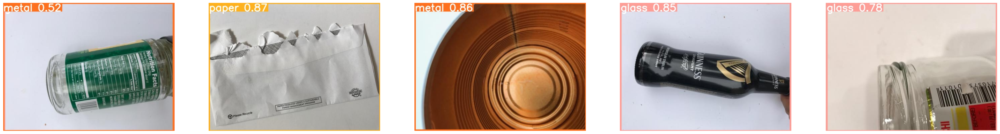

In [130]:
from PIL import Image
import os
import random

directory = '/deeplearning/YOLOV5_TRASH/yolov5/yolo_images_inference'

detection_images = [os.path.join(directory, x) for x in os.listdir(directory)]

limited_range = 5

selected_images = random.sample(detection_images, limited_range)

fig, axes = plt.subplots (nrows =1, ncols=limited_range, figsize=(40,40))

for i, image in enumerate(selected_images):
    
    detection_image = Image.open(image)
    axes[i].imshow(detection_image)
    axes[i].axis('off')

plt.show()
    